# Analyse Exploratoire du jeu de Données `les arbres` de la ville de Paris
*Les liens ne fonctionnent pas lorsque le notebook est affiché sur **Github**. Donc vous souhaitez visualiser ce notebook en ligne avec les liens menu actifs, vous pouvez le faire à cette adresse: https://nbviewer.org/github/Valkea/OC_AI_02/blob/main/EDA.ipynb )*

* [1. Objectif du projet](#P01)
    * [Les actions à optimiser](#P01_actions)
* [2. **Présentation générale du jeu de données**](#P02)
* [3. **Démarche méthodologique d’analyse de données**](#P03)
    * [Analyse univariée](#P02_univariate)
    * [Analyse multivariée](#P02_multivariate)
        * [Corrélation entre variables numériques](#P03_correlation_num)
        * [Corrélation entre variables nominales](#P03_correlation_nom)
        * [Analyse orientée](#P03_objectifs)
* [4. Nettoyage des données](#P04)
    * [Suppression des colonnes inutiles](#P04_dropuseless)
    * [Renommage des colonnes](#P04_renamecols)
    * [Détection et suppression des valeurs aberrantes](#P04_outliers)
    * [Imputation des valeurs manquantes](#P04_inputs)
        * [Imputation des colonnes `genre` et `libelle_francais`](#P04_input_genre_libelle)
        * [Imputation de la colonne `remarquable`](#P04_input_remarquable)
        * [Imputation de la colonne `stade_developpement`](#P04_input_stade_developpement)
            * [KNN, RandomForest...](#P04_input_stade_developpement_classifiers)
    * [Détection et suppression des doublons](#P04_clean_duplicate)
* [5. **Synthèse de l'analyse de données**](#P05)

# 1. Objectif du projet <a class="anchor" id="P01"></a>
l'optimisation des tournées pour l’entretien des arbres de la ville. 

## Les différentes actions de l'entretien du parc parisien <a class="anchor" id="P01_actions"></a>

Afin d'optimiser les tournées pour l'entretien des arbres de la ville, il convient de déterminer les différentes actions que le personnelle est ammené à entreprendre et si possible leur fréquence.

### L'arrosage

> **Arrosage de croissance** Une fois planté, l'arbre reçoit des soins pendant 3 ans pour garantir une bonne reprise et un développement harmonieux : il est arrosé régulièrement (environ 100 litres d’eau tous les 15 jours de mars à septembre). Après ces 3 premières années, l’arbre en pleine croissance (sauf exception) ne nécessite plus de soin particulier.


### Le suivi et diagnostic
Pour détecter les arbres morts, dépérissant et dangereux ou même leurs éventuels problèmes de santé (champignons, insectes, tassement de la terre, lésions sur le tronc etc.) chacun d'entre eux est contrôlé au moins une fois par an.
> **Le contrôle annuel.** Un diagnostic visuel est réalisé à l’occasion des campagnes annuelles de surveillance phytosanitaires. (Tous les arbres sont inspectés chaque année, mais seuls 20 % d’entre eux font l’objet d’un relevé phytosanitaire détaillé).

> **Le contrôle d'entretien.** Un diagnostic visuel est réalisé lors de chaque intervention d’entretien.

> **Le controle interne.** Des expertises sont pratiquées à l’aide d’outils de détection des défauts internes du bois.

> **Le contrôle des tuteurs.** Pour les arbres de moins de 3 ans, un tuteur est installé pour lui assurer une bonne stabilité le temps que les racines d’ancrages soient suffisamment développées. Il faut donc en vérifier le positionnement et la bonne dimension à interval régulier.


### La taille (ou élagage)
Un arbre sain et adapté au site ne devrait pas nécessiter de taille, mais le contexte urbain impose des contraintes qui peuvent y pousser. Voici les différents types de taille appliquées sur le parc Parisien:

> **La taille de formation.** Réalisée sur les jeunes arbres, la taille de formation vise à les adapter aux futures contraintes de la culture en ville, notamment le passage des véhicules et des piétons sous son houppier. Cette opération précoce est réalisée sans grosses blessures (qui constitueraient des points de fragilité et d'entrée de maladies).

> **La taille « raisonnée » des arbres adultes.** La taille « raisonnée » consiste à réduire le volume du houppier par élimination de branches et de bois mort. Elle est réalisée sur un faible volume en prenant soin de limiter la coupe des grosses branches pour respecter la biologie de l’arbre et minimiser le risque de prolifération des maladies.

> **La taille architecturée dite « en plateau-rideau ».** Elle maintient les arbres dans des formes géométriques qui soulignent les perspectives de sites historiques (tels le Champ de Mars, la place des Vosges). Elle s’effectue par tailles légères et répétées sur de faibles sections en périphérie du houppier.

> **La taille de réduction.** Cette taille est nécessaire en ville pour contrôler le volume et la hauteur d’arbres poussant très près des façades. 

Chacune de ces méthodes va nécessiter des équipes et équipements sensiblement différents. Donc il convient d'organiser les tournées pour s'occuper d'un type de taille à la fois. Dans ce contexte, il est intéressant de pouvoir distinguer les arbres en fonction de divers critères (hauteur, essence, domanialité...).

### L'abatagge
Le remplacement des arbres morts, dangereux ou dépérissant constitue une mission essentielle de la Ville pour préserver la canopée parisienne. Moins de 1,5 % des arbres doivent être abattus chaque année.

> **L'abattage anticipé.** L'espérance de vie de certains abres sont connues à l'avance et leur remplacement peut donc être anticipé. Par exemple, les arbres plantés le long des rues dépassent rarement 80 ans (Ils peuvent contracter des maladies, être blessés (au niveau des racines, du tronc ou du houppier) ou décliner.

> **L'abattage non-anticipé.** Pour les mêmes raisons qu'évoqué ci-dessus, on peut être ammené à abattre un arbre qui présente un danger, alors même qu'il ne se trouvait pas dans un contexte qui permettait de l'anticiper.

Selon la taille de l'arbre les outils utilisés ne sont probablement pas les même. Outre la coupe du tronc, l'arachage de la souche peut être un véritable défit. Certaines espèces développement des raçines particulièrement profondes ou étendues et on considère en général que la taille du système racinaire est équivalent à celui du houppier. Ainsi, les outils nécessaires pour retirer la souche d'un jeune abre ne sont probablement pas les mêmes que ceux nécessaires pour retirer la souche d'un abre qui faisait 15m de haut.


### Le (re)plantage
Le parc végétal de Paris doit être renouvellé (lorsqu'un arbre est abattu) et étendu pour répondre aux nouveaux objectifs de la Ville et de ses habitants.

> **La fosse de plantation.** Avant de (re)planter un arbre, il faut préparer un espace suffisant pour son futur développement. Le volume de la fosse de plantation est d’environ 12 mètres cubes pour permettre un développement satisfaisant du système racinaire et une alimentation en eau et en éléments nutritifs appropriées à sa croissance. 

> **Le replantage.** Moins de 1,5 % des arbres doivent être abattus chaque année. De jeunes arbres issus des pépinières de la Ville de Paris sont systématiquement replantés.

> **Le plantage.** De nouveaux arbres sont plantés dans les 30 ha de nouveaux parcs, jardins et squares. Par ailleurs, les zones existantes sont également sujettes à la plantation de nouveaux arbres pour densifier ou étendre l'existant.

> **La diversification.** Les espèce des arbres sont choisies en fonction du contexte de (re)plantage afin d'améliorer la résistante aux insectes et aux champignons mais aussi pour prendre en compte le réchauffement climatique.

> **Les essences régionales.** Pour permettre le développement de la faune local (oiseaux, abeilles, ...), on favorise autant que possible (tout en considérent le besoin de diversification) les espèces d'arbres issues de la région île de France.

Dans tous les cas, une fois planté l'arbre doit recevoir des soins pendant 3 ans pour garantir une bonne reprise et un développement harmonieux


#### Importons quelques librairies utile pour ce notebook.
- Pandas et numpy pour faciliter les manipulations du jeu de données
- Matplotlib et Seaborn (une sur-couche de Matplotlib) pour les graphiques

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 2. Présentation générale du jeu de données <a class="anchor" id="P02"></a>

Le [jeu de données](https://opendata.paris.fr/explore/dataset/les-arbres/information/?disjunctive.typeemplacement&disjunctive.arrondissement&disjunctive.libellefrancais&disjunctive.genre&disjunctive.espece&disjunctive.varieteoucultivar&disjunctive.stadedeveloppement&disjunctive.remarquable&dataChart=eyJxdWVyaWVzIjpbeyJjb25maWciOnsiZGF0YXNldCI6Imxlcy1hcmJyZXMiLCJvcHRpb25zIjp7ImRpc2p1bmN0aXZlLnR5cGVlbXBsYWNlbWVudCI6dHJ1ZSwiZGlzanVuY3RpdmUuYXJyb25kaXNzZW1lbnQiOnRydWUsImRpc2p1bmN0aXZlLmxpYmVsbGVmcmFuY2FpcyI6dHJ1ZSwiZGlzanVuY3RpdmUuZ2VucmUiOnRydWUsImRpc2p1bmN0aXZlLmVzcGVjZSI6dHJ1ZSwiZGlzanVuY3RpdmUudmFyaWV0ZW91Y3VsdGl2YXIiOnRydWUsImRpc2p1bmN0aXZlLnN0YWRlZGV2ZWxvcHBlbWVudCI6dHJ1ZSwiZGlzanVuY3RpdmUucmVtYXJxdWFibGUiOnRydWUsImJhc2VtYXAiOiJqYXdnLnN0cmVldHMiLCJsb2NhdGlvbiI6IjEzLDQ4Ljg2ODQ0LDIuMzA5NDUifX0sImNoYXJ0cyI6W3siYWxpZ25Nb250aCI6dHJ1ZSwidHlwZSI6ImNvbHVtbiIsImZ1bmMiOiJBVkciLCJ5QXhpcyI6ImlkYmFzZSIsInNjaWVudGlmaWNEaXNwbGF5Ijp0cnVlLCJjb2xvciI6IiMwMDMzNjYifV0sInhBeGlzIjoidHlwZWVtcGxhY2VtZW50IiwibWF4cG9pbnRzIjo1MCwic29ydCI6IiJ9XSwidGltZXNjYWxlIjoiIiwiZGlzcGxheUxlZ2VuZCI6dHJ1ZSwiYWxpZ25Nb250aCI6dHJ1ZX0%3D&location=11,48.84054,2.43622&basemap=jawg.streets) utilisé dans le cadre du programme **“Végétalisons la ville”** est une liste des arbres relevant de la ville de Paris.

Chacun des arbre référencé est décrit par un certain nombre de caractèristiques *(hauteur, circonférence, variété, espèce, genre)*<br>et est précisement localisable *(coordonnées GPS, addresse, repères...)* dans l'espace Parisien.

Ce jeu de données inclut les arbres d’alignement (dans les rues), ceux des espaces verts et des équipements publics municipaux.<br>Mais il n’inclut pas les bosquets, les ensembles forestiers, les arbres du domaine privé etc.

---
#### Commençons par importer et explorer simplement ce jeu de données pour nous faire une idée de ce qu'il contient.

In [2]:
data = pd.read_csv('data/p2-arbres-fr.csv', sep=';')

In [3]:
data.head(3)

,id,type_emplacement,domanialite,arrondissement,complement_addresse,numero,lieu,id_emplacement,libelle_francais,genre,espece,variete,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
0,99874,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,19,Marronnier,Aesculus,hippocastanum,NaN,20,5,NaN,0.0,48.857620,2.320962
1,99875,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,20,If,Taxus,baccata,NaN,65,8,A,NaN,48.857656,2.321031
2,99876,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,21,If,Taxus,baccata,NaN,90,10,A,NaN,48.857705,2.321061


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200137 entries, 0 to 200136
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   200137 non-null  int64  
 1   type_emplacement     200137 non-null  object 
 2   domanialite          200136 non-null  object 
 3   arrondissement       200137 non-null  object 
 4   complement_addresse  30902 non-null   object 
 5   numero               0 non-null       float64
 6   lieu                 200137 non-null  object 
 7   id_emplacement       200137 non-null  object 
 8   libelle_francais     198640 non-null  object 
 9   genre                200121 non-null  object 
 10  espece               198385 non-null  object 
 11  variete              36777 non-null   object 
 12  circonference_cm     200137 non-null  int64  
 13  hauteur_m            200137 non-null  int64  
 14  stade_developpement  132932 non-null  object 
 15  remarquable      

> On constate que ce jeu de donnée est composé de 18 variables (colonnes) pour 200137 individus (lignes).
> - 3 colonne de type `int64` (nombres entiers),
> - 4 colonnes de type `float64` (nombres à virgule flottante),
> - 11 colonnnes de type `object` (textes)

#### Regardons d'un peu plus près les colonnes numériques

In [5]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
id,200137.0,387202.682308,545603.242357,99874.000000,155927.000000,221078.000000,274102.000000,2.024745e+06
numero,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
circonference_cm,200137.0,83.380479,673.190213,0.000000,30.000000,70.000000,115.000000,2.502550e+05
hauteur_m,200137.0,13.110509,1971.217387,0.000000,5.000000,8.000000,12.000000,8.818180e+05
remarquable,137039.0,0.001343,0.036618,0.000000,0.000000,0.000000,0.000000,1.000000e+00
geo_point_2d_a,200137.0,48.854491,0.030234,48.742290,48.835021,48.854162,48.876447,4.891148e+01
geo_point_2d_b,200137.0,2.348208,0.051220,2.210241,2.307530,2.351095,2.386838,2.469759e+00


> Sachant qu'il y a 200137 individus dans le dataset, on constate qu'il ne manque des lignes que pour les colonnes `numero` (toutes) et `remarquable` (73098).

> Par ailleurs il apparait d'ores et déjà que certaines colonnes comme `circonference_cm` et `hauteur_m` ont des valeurs min et max qui ne semblent pas cohérentes avec leurs intitulés.

#### Regardons d'un peu plus près les autres colonnes

In [6]:
data.describe(exclude='number').T

,count,unique,top,freq
type_emplacement,200137,1,Arbre,200137
domanialite,200136,9,Alignement,104949
arrondissement,200137,25,PARIS 15E ARRDT,17151
complement_addresse,30902,3795,SN°,557
lieu,200137,6921,PARC FLORAL DE PARIS / ROUTE DE LA PYRAMIDE,2995
id_emplacement,200137,69040,101001,1324
libelle_francais,198640,192,Platane,42508
genre,200121,175,Platanus,42591
espece,198385,539,x hispanica,36409
variete,36777,436,Baumannii',4538


> On constate cette fois qu'il y a un beaucoup plus de colonnes pour lesquelles il manque des valeurs; `domanialite` (1), `complement_addresse` (169235), `libelle_francais` (1497), `genre` (16), `espece` (1752), `variete` (163360) et `stade_developpement` (67205).

> Par ailleurs, on peut observer que la colonne `id_emplacement` semble avoir peu de redondance de valeurs alors qu'a l'inverse, la colonne `type_emplacement` ne semble avoir qu'une unique valeur.

#### Regardons les valeurs manquantes sous un autre angle (taux et graphique)

In [7]:
# Definission une fonction qui nous permet d'afficher 
# facilement le nombre de valeurs manquantes et leur taux

def print_missing_counts(dataset, col_array):
    missing_count = dataset[col_array].isnull().sum()
    for k, v in zip(missing_count.keys(), missing_count):
        fraction = v/dataset.shape[0]*100.0
        print(f"{k.rjust(20)} is missing {v:6} values \t -->   {fraction:6.2f}%")

In [8]:
print_missing_counts(data, data.columns)

                  id is missing      0 values 	 -->     0.00%
    type_emplacement is missing      0 values 	 -->     0.00%
         domanialite is missing      1 values 	 -->     0.00%
      arrondissement is missing      0 values 	 -->     0.00%
 complement_addresse is missing 169235 values 	 -->    84.56%
              numero is missing 200137 values 	 -->   100.00%
                lieu is missing      0 values 	 -->     0.00%
      id_emplacement is missing      0 values 	 -->     0.00%
    libelle_francais is missing   1497 values 	 -->     0.75%
               genre is missing     16 values 	 -->     0.01%
              espece is missing   1752 values 	 -->     0.88%
             variete is missing 163360 values 	 -->    81.62%
    circonference_cm is missing      0 values 	 -->     0.00%
           hauteur_m is missing      0 values 	 -->     0.00%
 stade_developpement is missing  67205 values 	 -->    33.58%
         remarquable is missing  63098 values 	 -->    31.53%
      ge

<AxesSubplot:>

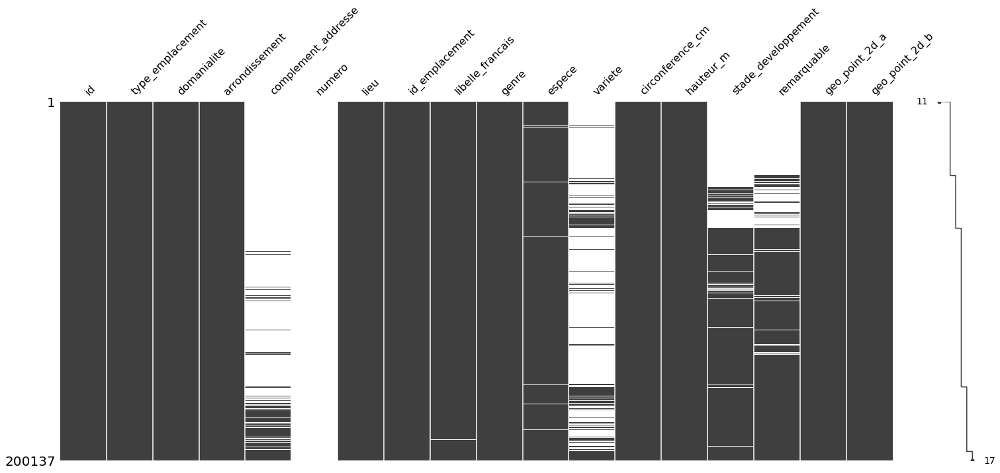

In [9]:
import missingno as msno
msno.matrix(data, sort="ascending")

### Les variables

Elles ne sont pas décrites sur l'espace Opendata dédié à ce [jeu de données](https://opendata.paris.fr/explore/dataset/les-arbres/information/?disjunctive.typeemplacement&disjunctive.arrondissement&disjunctive.libellefrancais&disjunctive.genre&disjunctive.espece&disjunctive.varieteoucultivar&disjunctive.stadedeveloppement&disjunctive.remarquable&dataChart=eyJxdWVyaWVzIjpbeyJjb25maWciOnsiZGF0YXNldCI6Imxlcy1hcmJyZXMiLCJvcHRpb25zIjp7ImRpc2p1bmN0aXZlLnR5cGVlbXBsYWNlbWVudCI6dHJ1ZSwiZGlzanVuY3RpdmUuYXJyb25kaXNzZW1lbnQiOnRydWUsImRpc2p1bmN0aXZlLmxpYmVsbGVmcmFuY2FpcyI6dHJ1ZSwiZGlzanVuY3RpdmUuZ2VucmUiOnRydWUsImRpc2p1bmN0aXZlLmVzcGVjZSI6dHJ1ZSwiZGlzanVuY3RpdmUudmFyaWV0ZW91Y3VsdGl2YXIiOnRydWUsImRpc2p1bmN0aXZlLnN0YWRlZGV2ZWxvcHBlbWVudCI6dHJ1ZSwiZGlzanVuY3RpdmUucmVtYXJxdWFibGUiOnRydWUsImJhc2VtYXAiOiJqYXdnLnN0cmVldHMiLCJsb2NhdGlvbiI6IjEzLDQ4Ljg2ODQ0LDIuMzA5NDUifX0sImNoYXJ0cyI6W3siYWxpZ25Nb250aCI6dHJ1ZSwidHlwZSI6ImNvbHVtbiIsImZ1bmMiOiJBVkciLCJ5QXhpcyI6ImlkYmFzZSIsInNjaWVudGlmaWNEaXNwbGF5Ijp0cnVlLCJjb2xvciI6IiMwMDMzNjYifV0sInhBeGlzIjoidHlwZWVtcGxhY2VtZW50IiwibWF4cG9pbnRzIjo1MCwic29ydCI6IiJ9XSwidGltZXNjYWxlIjoiIiwiZGlzcGxheUxlZ2VuZCI6dHJ1ZSwiYWxpZ25Nb250aCI6dHJ1ZX0%3D&location=11,48.84054,2.43622&basemap=jawg.streets) *(il y a juste les types)*. Mais on peut déduire leur rôle en se basant sur leur nom, en explorant leur contenu et en se référent à des ressources exterieurs d'aide à la compréhension métier comme l'article de la Mairie de Paris: [L'arbre à Paris](https://www.paris.fr/pages/l-arbre-a-paris-199).

---
#### Analysons donc ces variables une par une puis par groupe pour en comprendre le sens et les éventuels problèmes qu'elles posent.

# 3. Démarche méthodologique d'analyse de données <a class="anchor" id="P03"></a>

## 3.1 Analyse univariée des 18 variables <a class="anchor" id="P02_univariate"></a>

## `id`

In [10]:
pd.set_option('float_format', '{:.0f}'.format)
data['id'].describe()

count    200137
mean     387203
std      545603
min       99874
25%      155927
50%      221078
75%      274102
max     2024745
Name: id, dtype: float64

In [11]:
data['id'].nunique()

200137

In [12]:
data['id'].isnull().sum()

0

On constate que c'est une liste d'entier numérique et qu'il y a **autant d'id que de lignes dans le jeu de donnée**.

Par ailleurs, les valeurs vont de 99874 à 2024745, donc elles ne commencent pas à 0 et ne se suivent pas nécessairement.


> **id:** [int] > **[int64]**<br>
l'identifiant de l'arbre dans le jeu de donnée.<br>
A ne pas confondre avec l'index du DataFrame Pandas.

> `Recommandation:` ne pas prendre en compte cette colonne dans l'analyse.

---

## `type_emplacement`

In [13]:
data['type_emplacement'].describe()

count     200137
unique         1
top        Arbre
freq      200137
Name: type_emplacement, dtype: object

In [14]:
data['type_emplacement'].unique()

array(['Arbre'], dtype=object)

Cette colonne ne contient qu'**une unique valeur 'Arbre'**.

On peut supposer que ce jeu de données est issu d'un autre jeu de données contenant davantages de types de plantes. Peut-être les espaces pour les buissons, pour les fleurs, etc.

> **type_emplacement:** [text] > **[object]**<br>
le type de plante dans un plus gros jeu de données.<br>
Elle ne présente donc aucune utilité dans l'état actuel.

> `Recommandation:` supprimer la colonne.

---

## `domanialite`

In [15]:
data['domanialite'].describe()

count         200136
unique             9
top       Alignement
freq          104949
Name: domanialite, dtype: object

In [16]:
data['domanialite'].unique()

array(['Jardin', 'Alignement', 'DJS', 'DFPE', 'CIMETIERE', 'DASCO', 'DAC',
       'PERIPHERIQUE', 'DASES', nan], dtype=object)

La pluspart de ces domaines sont facile à identifier. Et pour ceux qui le sont moins on trouve facilement à quoi ils correspondent en cherchant sur internet:
- DFPE - Direction des Familles et de la Petite Enfance
- DJS - Direction de la Jeunesse et des Sports
- DASCO - Direction des Affaires Scolaires
- DAC - Direction des Affaires Culturelles
- DASES - Direction de l'Action Sociale de l'Enfance et de la Santé

On note par ailleurs que certaines lignes ont `nan` pour valeur .
#### Explorons donc plus avant pour savoir ce que ce(s) `nan` représente(nt).

In [17]:
data['domanialite'].isnull().sum()

1

In [18]:
data[ data['domanialite'].isnull() ]

,id,type_emplacement,domanialite,arrondissement,complement_addresse,numero,lieu,id_emplacement,libelle_francais,genre,espece,variete,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
197239,2020911,Arbre,NaN,PARIS 20E ARRDT,NaN,NaN,JARDINS D IMMEUBLES PORTE DE VINCENNES NORD / ...,203006,Chimonanthe,Chimonanthus,praecox,NaN,35,4,JA,0,49,2


C'est visiblement un problème isolé (il n'y a qu'un seul `nan`) qui doit être un oubli.

#### Ensuite, voyons comment les arbres se répartissent dans ces domaines

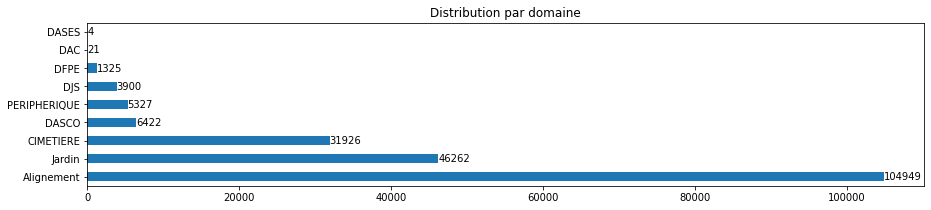

In [19]:
fig = plt.figure(figsize=(15,3))

ax = data['domanialite'].value_counts(dropna=True).plot(kind='barh', title="Distribution par domaine")

for container in ax.containers:
    ax.bar_label(container)
    
plt.show()

> **domanialite:** [text] > **[object]**<br>
le type de lieu ou l'entité administrative à laquelle appartient l'arbre.

> `Recommandation:` garder la colonne, mais supprimer ou imputer *la ligne* problèmatique.

---

## `arrondissement`

In [20]:
data['arrondissement'].describe()

count              200137
unique                 25
top       PARIS 15E ARRDT
freq                17151
Name: arrondissement, dtype: object

In [21]:
data['arrondissement'].unique()

array(['PARIS 7E ARRDT', 'PARIS 17E ARRDT', 'PARIS 16E ARRDT',
       'PARIS 4E ARRDT', 'PARIS 13E ARRDT', 'PARIS 12E ARRDT',
       'PARIS 19E ARRDT', 'PARIS 14E ARRDT', 'PARIS 15E ARRDT',
       'PARIS 3E ARRDT', 'PARIS 20E ARRDT', 'PARIS 18E ARRDT',
       'PARIS 6E ARRDT', 'PARIS 11E ARRDT', 'PARIS 1ER ARRDT',
       'PARIS 2E ARRDT', 'PARIS 5E ARRDT', 'VAL-DE-MARNE',
       'SEINE-SAINT-DENIS', 'HAUTS-DE-SEINE', 'PARIS 9E ARRDT',
       'PARIS 10E ARRDT', 'PARIS 8E ARRDT', 'BOIS DE BOULOGNE',
       'BOIS DE VINCENNES'], dtype=object)

Ce sont visiblement les arrondissement de Paris. Mais notons qu'en plus de 20 arrondissement Parisiens, 5 autres secteurs semblent également dépendre des services de Paris. Il en existe donc 25 au total, et aucun n'est le doublon d'un autre à cause d'un formatage différent.

#### Visualisons la répartition des arbres dans ces arrondissement

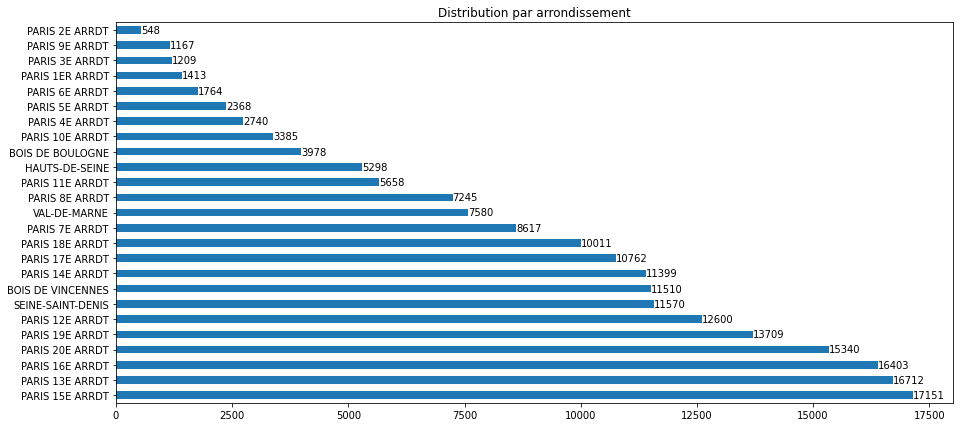

In [22]:
fig = plt.figure(figsize=(15,7))

ax = data['arrondissement'].value_counts().plot(kind='barh', title="Distribution par arrondissement")

for container in ax.containers:
    ax.bar_label(container)
    
plt.show()

#### Et vérifions si il en manque.

In [23]:
data['arrondissement'].isnull().sum()

0

> **arrondissement:** [text] > **[object]**<br>
l'arrondissement dans lequel se trouve l'arbre.<br>

> `Recommandation:` garder la colonne.

---

## `complement_addresse`

In [24]:
data['complement_addresse'].describe()

count     30902
unique     3795
top         SN°
freq        557
Name: complement_addresse, dtype: object

In [25]:
data['complement_addresse'].unique()[:100]

array([nan, 'c 12', '12-36', '12-35', 'face 64 Manin', '19-02', '19-06',
       '19-07', '19-09', '19-08', '19-10', '82 à 90', '19-04', '19-16',
       '19-12', '19-11', '19-03', '13-04', '13-01', '13-03', '07-09',
       '07-06', '07-05', '07-04', '70 à 80', '14-06', '07-03', '07-01',
       '07-02', '07-07', '07-08', '07-11', '16-57', '16-56', '79',
       '07-10b', '07-10', '07-13', '14-11', '75 à 77', '14-05', '89',
       '92', '79 à 83', '75-77', '15-02', '15-04', '29 à 39', '41 à 49',
       '15-05', '18-14', '18-10', '14-13', '16-47', '15-01', 'F 3',
       'F 3-5', 'F 5', 'F 5-7', 'F 7', '14-01', '14-10', '54 à 68',
       '46 à 50', '34 à 44', '27 à 29', '20 rue Gazan', '52 à 54',
       '29 a 39', '63 à 73', '11 à 27', '1 à 9', '51 à 61', '26 à 32',
       '29 -39', '27-29', '20 à 26', '14 à 20', '6 à 12', '03-01',
       '209 RUE D ALESIA', '<Nul>', '03-05', 'f2 Rue E. Spuller', '03-04',
       '96', 'face bataclan', '87', '78', '72', '53', '123',
       '125 richard lenoir

On a visiblement essentiellement des numéros de rue et des fragments d'adresses.

Mais on constate également la présence de `nan`. 

#### Regardons alors quelle fraction est concernée par ces `nan`.

In [26]:
data['complement_addresse'].isnull().sum()

169235

In [27]:
169235/200137*100

84.55957668996737

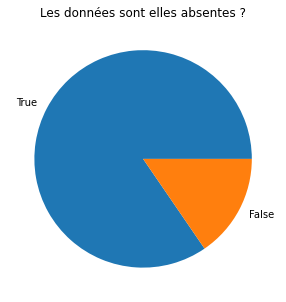

In [28]:
fig = plt.figure(figsize=[5,5])
check = data['complement_addresse'].isnull().value_counts()
plt.pie(list(check), labels=check.keys())
#plt.legend()
plt.title("Les données sont elles absentes ?")
plt.show()

Donc la majorité des lignes (~85%) ne semblent pas être renseignées. Et le reste est composé de numéros de rue, de fragments d'adresse ou d'indications visuelles pour se repérer.

> **complement_addresse:** [text] > **[object]**<br>
des informations supplémentaires pour faciliter la localisation de l'arbre; un numéro de rue, un point de repère ...

> `Recommandation:` ne pas en prendre compte telle-quelle. Elle ne semble avoir aucun pouvoir prédictif; il manque beaucoup de lignes et celles qui existent ont beaucoup de formats différents. Mais elle peut éventuellement servir à composer une nouvelle colonne.

---

## `numero`

In [29]:
data['numero'].describe()

count     0
mean    NaN
std     NaN
min     NaN
25%     NaN
50%     NaN
75%     NaN
max     NaN
Name: numero, dtype: float64

In [30]:
data['numero'].unique()

array([nan])

#### Vérifions quelle fraction manque

In [31]:
data['numero'].isnull().sum()

200137

In [32]:
200137/200137*100

100.0

Cette **colonne est vide** et les numéros sont visiblement dans les colonnes `complement_addresse` (ou *lieu*).

> **numero:**[text] > **[float64]**<br>
le numéro de rue auquel se trouve l'arbre.<br>

> `Recommandation:` supprimer la colonne.

---

## `lieu`

In [33]:
data['lieu'].describe()

count                                          200137
unique                                           6921
top       PARC FLORAL DE PARIS / ROUTE DE LA PYRAMIDE
freq                                             2995
Name: lieu, dtype: object

In [34]:
data['lieu'].unique()[:20]

array(['MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E',
       'PARC CLICHY-BATIGNOLLES-MARTIN LUTHER KING',
       'SQUARE ALEXANDRE ET RENE PARODI / 1 PLACE DE LA PORTE MAILLOT',
       'JARDIN DE L AVENUE FOCH / 10 AVENUE FOCH', 'JARDIN DU RANELAGH',
       'JARDIN DE LA CITE INTERNATIONALE DES ARTS',
       'SQUARE ALBERT SCHWEITZER',
       'JARDIN DU GENERAL ANSELIN / 1 AVENUE DE POLOGNE',
       'SQUARE CLARA ZETKIN / 21 AVENUE BOUTROUX', 'SQUARE GANDON',
       'PARC DE BERCY', 'PARC DES BUTTES CHAUMONT',
       'JARDIN DU CHAMP DE MARS', 'SQUARE RENE LE GALL',
       'SQUARE DE LA PORTE DE LA VILLETTE', 'PARC MONTSOURIS',
       'JARDIN ALBERTO GIACOMETTI',
       'PARC GEORGES BRASSENS / 2 PLACE JACQUES MARETTE',
       'JARDINIERE PLACE THEODOR HERZL', 'SQUARE EMILE CHAUTEMPS'],
      dtype=object)

Ce sont visiblement les adresses où se trouvent les arbres.

Mais on constate que le format est très variable;
- il y a parfois des séparateur " / ",
- il y a parfois juste le nom d'un lieu (jardin, square, parc...)
- et il y a parfois l'adresse complete (numero et nom de rue)

#### Voyons les `lieux` qui ressortent le plus

In [35]:
data['lieu'].value_counts()[:10] # top 10

PARC FLORAL DE PARIS / ROUTE DE LA PYRAMIDE                                  2995
PARC DES BUTTES CHAUMONT                                                     2331
PARC ANDRE CITROEN                                                           2095
PARC OMNISPORT SUZANNE LENGLEN / 7 BOULEVARD DES FRERES VOISIN               1478
INSEP / AVENUE DU TREMBLAY                                                   1293
JARDIN DU CHAMP DE MARS                                                      1276
ARBORETUM DE L ECOLE DU BREUIL - ROUTE DE LA FERME / ROUTE DE LA PYRAMIDE    1261
AVENUE DES CHAMPS ELYSEES                                                    1246
PARC DE BERCY                                                                1223
PARC MONTSOURIS                                                              1167
Name: lieu, dtype: int64

#### Et à présent voyons si un découpage selon le séparateur " / " changerait quelque chose à ce classement.

In [36]:
lieu_split = data['lieu'].str.split('[/|-]', expand=True)

In [37]:
lieu_split_total = pd.concat([lieu_split[0].str.strip(), lieu_split[1].str.strip(), lieu_split[2].str.strip()])

In [38]:
lieu_split_total.value_counts()[:10] # top 10

CIMETIERE DE PANTIN           9135
CIMETIERE DE THIAIS           5612
ROUTE DE LA PYRAMIDE          5299
CIMETIERE DE BAGNEUX          4666
CIMETIERE DU PERE LACHAISE    3923
PARC FLORAL DE PARIS          2995
PARC DES BUTTES CHAUMONT      2331
PARC ANDRE CITROEN            2116
CIMETIERE DE SAINT            2108
CIMETIERE D'IVRY              1939
dtype: int64

En effet, le découpage, nettoyage, formatage des addresses données pourrait être utiles pour l'analyse.

#### Ajoutons au dataset une nouvelle colonne qui contient l'élement le plus générique
(donc celui qui se trouve le plus à gauche dans le découpage).

In [39]:
data['lieu_split0'] = lieu_split[0].str.strip()

> **lieu:** [text] > **[object]**<br>
l'adresse à laquelle on peut trouver l'arbre.

> `Recommandation:` garder la colonne et la retravailler pour la rendre plus pertinente; suppression des séparateurs, séparations des numéros de rues quand ils sont présents...

---

## `id_emplacement` 

In [40]:
data['id_emplacement'].describe()

count     200137
unique     69040
top       101001
freq        1324
Name: id_emplacement, dtype: object

In [41]:
data['id_emplacement'].unique()[:50]

array(['19', '20', '21', '22', '000G0037', '000G0036', '000G0035', '35',
       '802008', '802009', '802007', '20001', '20003', '20004', '20007',
       '20009', '20012', '20013', '20014', '20015', '20016', '20017',
       '20018', '20019', '20020', '20021', '20022', '20023', '20024',
       '20025', '20026', '20028', '20030', '20031', '20032', '20033',
       '20034', '20035', '20036', '20037', '20038', '20039', '20040',
       '20041', '30001', '30002', '30003', '30004', '30006', '30007'],
      dtype=object)

#### Vérifions si ces ID sont uniques

In [42]:
data['id_emplacement'].value_counts()

101001          1324
101002          1241
101003          1128
202001          1032
101004          1020
                ... 
A08700215015       1
190109             1
11230009           1
719480249          1
63603007           1
Name: id_emplacement, Length: 69040, dtype: int64

Ils ne sont donc pas uniques, mais quand un ID est utilisé plusieurs fois, est-ce forcement pour un même endroit ?

#### Regardons si un même ID se trouve toujours dans le même secteur / arrondissement

In [43]:
data[data['id_emplacement'] == '101003'].arrondissement.unique()

array(['PARIS 20E ARRDT', 'PARIS 1ER ARRDT', 'PARIS 16E ARRDT',
       'PARIS 14E ARRDT', 'PARIS 11E ARRDT', 'PARIS 2E ARRDT',
       'PARIS 18E ARRDT', 'PARIS 17E ARRDT', 'PARIS 12E ARRDT',
       'PARIS 13E ARRDT', 'PARIS 15E ARRDT', 'PARIS 19E ARRDT',
       'BOIS DE VINCENNES', 'PARIS 9E ARRDT', 'BOIS DE BOULOGNE',
       'PARIS 4E ARRDT', 'PARIS 5E ARRDT', 'PARIS 8E ARRDT',
       'PARIS 6E ARRDT', 'PARIS 7E ARRDT', 'PARIS 10E ARRDT',
       'PARIS 3E ARRDT'], dtype=object)

Donc les ID de ces emplacements sont réutilisés dans plusieurs arrondissements de Paris.

#### Et vérifions si il en manque.

In [44]:
data['id_emplacement'].isnull().sum()

0

Ce sont donc des identifiants composés de chiffres **ET** de lettres (pour certains), dont le format ne semble pas standardisé.

Par ailleurs aucun ne manque et certains ID sont réutilisés plusieurs fois dans des endroits distincts... Donc ces emplacements sont possiblement des sous sections d'entitées géographiques plus grandes (quartiers, arrondissements, ...)

> **id_emplacement:** [text] > **[object]**<br>
l'identifiant de l'emplacement auquel est lié l'arbre. Mais ces identifiants et les emplacements associées ne sont pas uniques.

> `Recommandation:` La colonne pourrait être utile si l'on parvient à identifier le découpage auquel ces ID correspondent.

---

## `libelle_francais`

In [45]:
data['libelle_francais'].describe()

count      198640
unique        192
top       Platane
freq        42508
Name: libelle_francais, dtype: object

#### Regardons le genre de valeurs présentes dans cette colonne

In [46]:
data['libelle_francais'].unique()[:100]

array(['Marronnier', 'If', 'Erable', 'Arbre à miel', 'Platane', 'Sophora',
       'Prunus n. sp.', 'Hêtre', 'Micocoulier', 'Tilleul', 'Chêne',
       'Savonnier', 'Copalme', 'Noyer', 'Arbre à caramel', 'Troene',
       'Tulipier', 'Pin', 'Sapin', 'Cerisier à fleurs', 'Charme-Houblon',
       'Cèdre', 'Paulownia', 'Thuya', 'Pommier à fleurs', 'Poirier',
       'Pommier', 'Bouleau', 'Orme', 'Arbre de Judée', 'Robinier',
       'Frêne', 'Aubépine', 'Fevier', 'Prunier à fleurs',
       'Arbre aux quarante écus', 'Néflier commun', 'Saule', 'Magnolia',
       'Prunier à fruits', 'Poirier à fleurs', 'Peuplier', 'Faux-cyprès',
       'Aubepine', nan, 'Plaqueminier', 'Mûrier', 'Pêcher', 'Pterocarya',
       'Merisier', 'Noisetier de Byzance', 'Alisier', 'Cognassier',
       'Parrotie de Perse - Arbre de fer', 'Poirier à fruits',
       'Orme de Sibérie', 'Frêne à fleurs', 'Aulne', 'Troëne',
       'Fontanesia', 'Cornouiller', 'Cedrele', 'Catalpa', 'Houx', 'Buis',
       'Metaséquoia', 'Chicot d

#### Visualisons la répartition de ces noms communs (disons les 25 premiers).

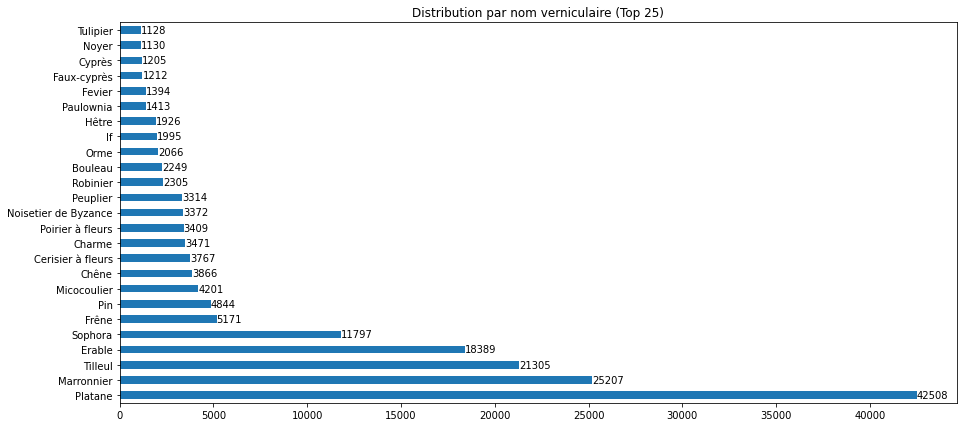

In [47]:
fig = plt.figure(figsize=(15,7))

ax = data['libelle_francais'].value_counts()[:25].plot(kind='barh', title="Distribution par nom verniculaire (Top 25)")

for container in ax.containers:
    ax.bar_label(container)
    
plt.show()

#### Enfin vérifions si il en manque.

In [48]:
data['libelle_francais'].isnull().sum()

1497

In [49]:
1497/200137*100

0.747987628474495

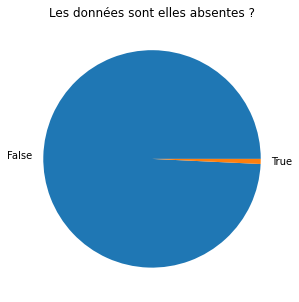

In [50]:
fig = plt.figure(figsize=[5,5])
check = data['libelle_francais'].isnull().value_counts()
plt.pie(list(check), labels=check.keys())
#plt.legend()
plt.title("Les données sont elles absentes ?")
plt.show()

Cette colonne rassemble donc les nom communs (ou verniculaires) des abres, en Français.

Il manque une petite fraction de ces valeurs (moins de 1%), mais il devrait être facile d'imputer ces valeurs si les colonnes `genre`, `espece` ou `variete` sont correctement remplies.

> **libelle_francais:** [text] > [object]<br>
le nom commun en Français, du genre de l'arbre.

> `Recommandation:` C'est une colonne qui est probablement redondante avec la colonne `genre`, mais qui pourrait aider à imputer plusieurs autres colonnes.

---

## `genre`

In [51]:
data['genre'].describe()

count       200121
unique         175
top       Platanus
freq         42591
Name: genre, dtype: object

#### Regardons le genre de valeurs présentes dans cette colonne

In [52]:
data['genre'].unique()[:100]

array(['Aesculus', 'Taxus', 'Acer', 'Tetradium', 'Platanus', 'Sophora',
       'Prunus', 'Fagus', 'Celtis', 'Tilia', 'Quercus', 'Koelreuteria',
       'Liquidambar', 'Juglans', 'Cercidiphyllum', 'Ligustrum',
       'Liriodendron', 'Pinus', 'Abies', 'Ostrya', 'Cedrus', 'Paulownia',
       'Thuja', 'Malus', 'Pyrus', 'Betula', 'Ulmus', 'Cercis', 'Robinia',
       'Fraxinus', 'Crataegus', 'Gleditsia', 'Ginkgo', 'Mespilus',
       'Salix', 'Magnolia', 'Populus', 'Chamaecyparis', 'Diospyros',
       'Morus', 'Pterocarya', 'Corylus', 'Sorbus', 'Cydonia', 'Parrotia',
       'Zelkova', 'Alnus', 'Cladrastis', 'Fontanesia', 'Cornus', 'Toona',
       'Catalpa', 'Ilex', 'Buxus', 'Metasequoia', 'Gymnocladus',
       'Maclura', 'Cephalotaxus', 'Rhus', 'Castanea', 'Ailanthus',
       'Broussonetia', 'Sequoiadendron', 'Lagerstroemia', 'Pterostyrax',
       'Eucalyptus', 'Olea', 'Ficus', 'Carpinus', 'Sambucus', 'Picea',
       'Amelanchier', 'Laburnum', 'Phillyrea', 'Sequoia', 'Aralia',
       'Phellode

#### Vérifions si il en manque.

In [53]:
data['genre'].isnull().sum()

16

In [54]:
16/200137*100

0.007994523751230408

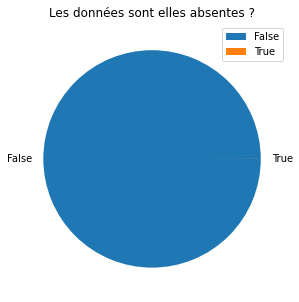

In [55]:
fig = plt.figure(figsize=[5,5])
check = data['genre'].isnull().value_counts()
plt.pie(list(check), labels=check.keys())
plt.legend()
plt.title("Les données sont elles absentes ?")
plt.show()

#### Enfin, visualisons la répartition de ces genre d'arbres (disons les 25 premiers), sans les `nan`.

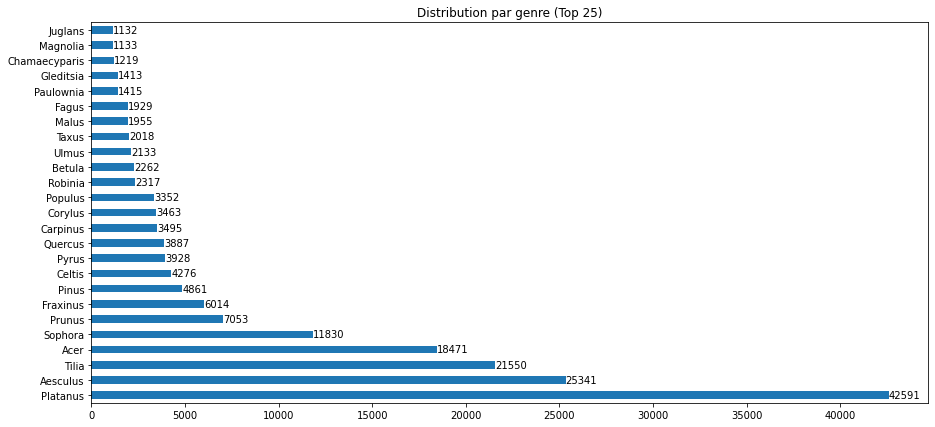

In [56]:
fig = plt.figure(figsize=(15,7))

ax = data['genre'].value_counts(dropna=True)[:25].plot(kind='barh', title="Distribution par genre (Top 25)")

for container in ax.containers:
    ax.bar_label(container)
    
plt.show()

Cette colonne rassemble donc les genre des abres, en Français.

Il manque quelques valeurs, mais on peut supprimer les lignes si la colonne se révèle peu importante, ou imputer les valeurs depuis les colonnes `libelle_francais`, `espece` ou `variete` si nécessaire.

> **genre:** [text] > **[object]**<br>
le genre de l'arbre.<br>
Le genre étant un ensemble d'espèces ayant en commun plusieurs caractères similaires.

> `Recommandation:` Il convient de garder cette colonne. Il manque quelques valeurs, qui doivent être supprimées ou imputées.

---

## `espece`

In [57]:
data['espece'].describe()

count          198385
unique            539
top       x hispanica
freq            36409
Name: espece, dtype: object

#### Regardons les valeurs présentes dans cette colonne

In [58]:
data['espece'].unique()[:100]

array(['hippocastanum', 'baccata', 'negundo', 'daniellii', 'x hispanica',
       'japonica', 'n. sp.', 'sylvatica', 'occidentalis', 'tomentosa',
       'robur', 'paniculata', 'rufinerve', 'styraciflua', 'nigra',
       'japonicum', 'lucidum', 'tulipifera', 'concolor', 'saccharinum',
       'x europaea', 'platyphyllos', 'platanoides', 'serrulata',
       'carpinifolia', 'libani', 'wallichiana', 'floribunda', 'pendula',
       'siliquastrum', 'pseudoacacia', 'excelsior', 'laevigata',
       'pseudoplatanus', 'triacanthos', 'cerasifera', 'campestre',
       'biloba', 'buergerianum', 'germanica', 'cerris', 'regia',
       'sylvestris', 'rubra', 'nigra subsp. nigra', 'alba',
       'tataricum subsp. ginnala', 'domestica', 'calleryana',
       'cappadocicum', 'x carnea', 'lawsoniana', 'x turneri', 'utilis',
       'maackii', 'kaki', 'cordata', 'persica', 'fraxinifolia',
       'frainetto', 'avium', 'x soulangeana', 'colurna', 'torminalis',
       'petraea', 'ilex', 'oblonga', 'davidii', 'com

#### Vérifions si il en manque.

In [59]:
data['espece'].isnull().sum()

1752

In [60]:
1752/200137*100

0.8754003507597296

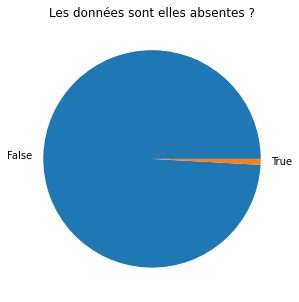

In [61]:
fig = plt.figure(figsize=[5,5])
check = data['espece'].isnull().value_counts()
plt.pie(list(check), labels=check.keys())
#plt.legend()
plt.title("Les données sont elles absentes ?")
plt.show()

#### Enfin, visualisons la répartition de ces espece d'arbres (disons les 25 premiers), sans les `nan`.

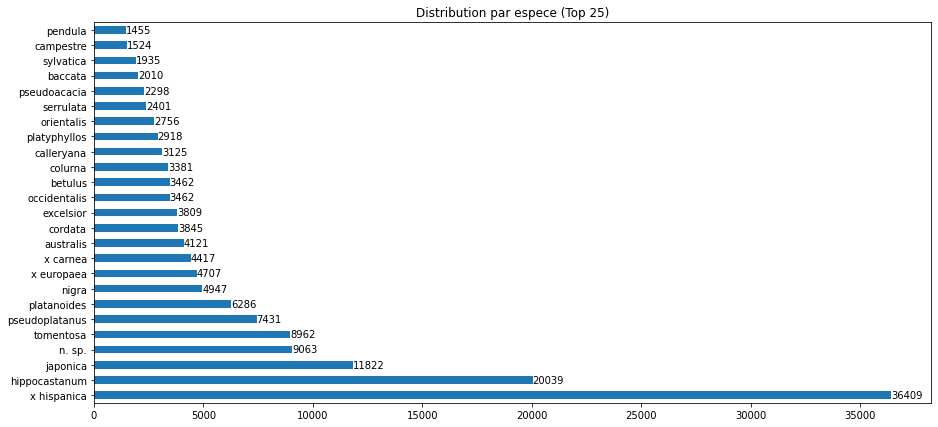

In [62]:
fig = plt.figure(figsize=(15,7))

ax = data['espece'].value_counts(dropna=True)[:25].plot(kind='barh', title="Distribution par espece (Top 25)")

for container in ax.containers:
    ax.bar_label(container)
    
plt.show()

Cette colonne rassemble donc les nom scientifiques (ou latins) des abres.

Il manque une petite fraction de ces valeurs (moins de 1%), mais il devrait être facile d'imputer ces valeurs si les colonnes `genre`, `libelle_francais` ou `variete` sont correctement remplies.

> **espece:** [text] > **[object]**<br>
le nom scientifique de l'espèce de l'arbre.

> `Recommandation:` Il convient de garder cette colonne. Il manque quelques valeurs, qui doivent être supprimées ou imputées.

---

## `variete`

In [63]:
data['variete'].describe()

count          36777
unique           436
top       Baumannii'
freq            4538
Name: variete, dtype: object

#### Regardons les valeurs présentes dans cette colonne

In [64]:
data['variete'].unique()[:100]

array([nan, "Atropunicea'", "Euchlora'", "Schwedleri'", "Pissardii'",
       "Pallida'", 'n. sp.', "Chanticleer'", "Purpureum'", "Italica'",
       "Aspleniifolia'", "Jacquemontii'", "Fastigiata'",
       "Fastigiate Koster'", "Imperialis'", "Honey Dew'",
       "Jacqueline Hillier'", "Rubra Plena'", "Diversifolia'",
       "Flamingo'", "Argentea Marginata'", "Pendula'", "Liempde'",
       "Pyramidalis'", "Tortuosa'", "Aurea'", "Frisia'", "Leopoldii'",
       "Aldenhamensis'", "Briotii'", "Kanzan'", "Variegata'", "Hizakura'",
       "Albomarginata'", "Bradford'", "Autumnalis Rosea'",
       "Atropurpurea'", "Castanaefolia'", "Eddie's White Wonder'",
       "Autumnalis'", "Heaven Scent'", "Schouten'", "Sundew'",
       "Leonard messel'", "Merrill'", "Plena'", "Unifolia'", "Accolade'",
       "Baumannii'", "Virginiana'", "Flying Dragon'", "Laciniata'",
       "Laciniatum'", "Globosum'", "Rohanii'", "Golden Hornet'",
       "Glauca'", "Youngii'", "Contorta'", "Umbraculifera'", "Jaspidea'"

#### Vérifions si il en manque.

In [65]:
data['variete'].isnull().sum()

163360

In [66]:
163360/200137*100

81.62408750006246

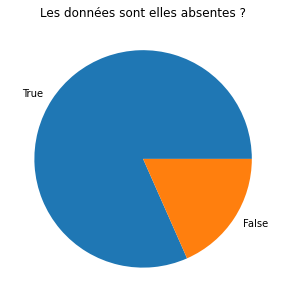

In [67]:
fig = plt.figure(figsize=[5,5])
check = data['variete'].isnull().value_counts()
plt.pie(list(check), labels=check.keys())
#plt.legend()
plt.title("Les données sont elles absentes ?")
plt.show()

#### Enfin, visualisons la répartition de ces variétés d'arbres (disons les 25 premiers), sans les `nan`.

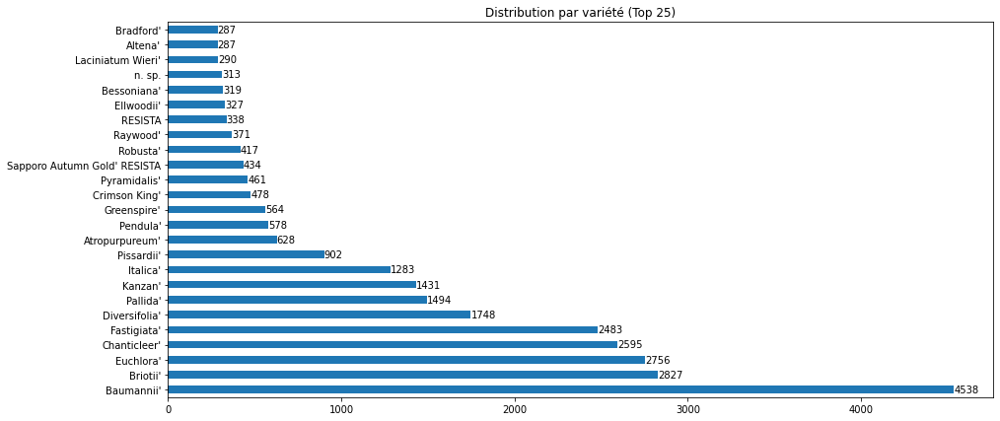

In [68]:
fig = plt.figure(figsize=(15,7))

ax = data['variete'].value_counts(dropna=True)[:25].plot(kind='barh', title="Distribution par variété (Top 25)")

for container in ax.containers:
    ax.bar_label(container)
    
plt.show()

Cette colonne indique donc la variété (sous espèce) des abres, mais on constate qu'il en manque beaucoup (~82%).

Par ailleurs, il semble qu'un aopostrophe soit systèmatiquement ajouté à la fin du nom (peut-être pour l'accoler à l'espèce ?).

Enfin on note la présent d'un `n. sp.` que l'on doit pouvoir traduire par 'Ne sais pas' et qu'il conviendrait donc de transformer en `nan`.

> **variete:**> [text] > **[object]**<br>
la varité de l'arbre.<br>
Le terme variété vient différencier les plantes d’une même espèce.

> `Recommandation:` Quoi que dans une certaine mesure redondante avec les colonnes `espece` ou `libelle_francais`, cette colonne pourrait certainement être utile. Mais il manque vraiment beaucoup de lignes et il serait plus simple de la supprimer (bien qu'elle puisse servir à imputer d'autres colonnes ou être elle même imputée)

---

## `circonference_cm`

In [69]:
pd.set_option('float_format', '{:.2f}'.format)
data['circonference_cm'].describe()

count   200137.00
mean        83.38
std        673.19
min          0.00
25%         30.00
50%         70.00
75%        115.00
max     250255.00
Name: circonference_cm, dtype: float64

On a donc visiblement des mesures de circonférences des troncs d'arbres en cm.

La moyenne est à 83cm et la plupart (75%) des arbres ont visiblement une circonférence de tronc inférieur ou égale à 115 cm.

Cependant, on note la présence de valeurs problèmatiques; le minimum est de 0 et le maximum est de 250255 cm. Il conviendrait donc de supprimer les outliers avec une technique appropriée (par multiple de quantile ou par KNN). [[Voir la section sur la suppresion de valeurs aberrantes](#P02_outliers)]

#### Vérifions si il en manque.

In [70]:
data['circonference_cm'].isnull().sum()

0

#### Enfin, vérifions la répartition des valeurs  (en gardant jusqu'a quantile 0.99 pour éliminer les plus aberrants)

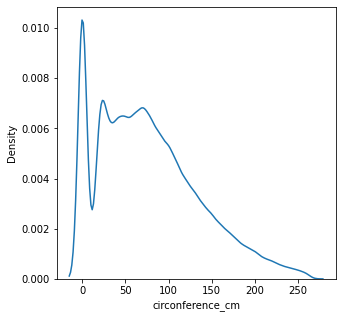

In [71]:
fig = plt.figure(figsize=(5,5))
sns.kdeplot(data[ data.circonference_cm < data.circonference_cm.quantile(0.99)].circonference_cm)
plt.show()

> **circonference_cm:** [int] > **[int64]**<br>
la circonférence de l'arbre (en centimètres).

> `Recommandation:` Il convient de garder cette colonne, mais elle doit être traitée pour supprimer ou imputer les valeurs aberrantes.

---

## `hauteur_m`

In [72]:
pd.set_option('float_format', '{:.2f}'.format)
data['hauteur_m'].describe()

count   200137.00
mean        13.11
std       1971.22
min          0.00
25%          5.00
50%          8.00
75%         12.00
max     881818.00
Name: hauteur_m, dtype: float64

On a donc visiblement des mesures de hauteur des arbres en mètres.

La moyenne est à environ 13 mètres et la plupart (75%) des arbres ont visiblement une hauteur inférieur ou égale à 12 mètres.

Cependant, on note la présence de valeurs problèmatiques; le minimum est de 0 et le maximum est de 881818 cm. Il conviendrait donc de supprimer les outliers avec une technique appropriée (par multiple de quantile ou par KNN). [[Voir la section sur la suppresion de valeurs aberrantes](#P02_outliers)]

#### Vérifions si il en manque.

In [73]:
data['hauteur_m'].isnull().sum()

0

#### Enfin, vérifions la répartition des valeurs (en gardant jusqu'a quantile 0.99 pour éliminer les plus aberrants)

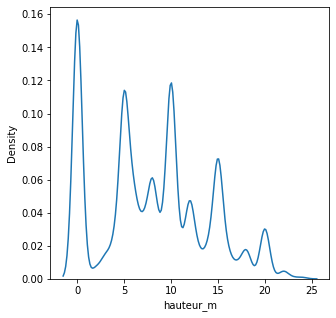

In [74]:
fig = plt.figure(figsize=(5,5))
sns.kdeplot(data[ data.hauteur_m < data.hauteur_m.quantile(0.99)].hauteur_m)
plt.show()

> **hauteur_m:** [int] > **[int64]**<br>
la hauteur de l'arbre (en mètres).

> `Recommandation:` Il convient de garder cette colonne, mais elle doit être traitée pour supprimer ou imputer les valeurs aberrantes.

---

## `stade_developpement`

In [75]:
data['stade_developpement'].describe()

count     132932
unique         4
top            A
freq       64438
Name: stade_developpement, dtype: object

#### Regardons les valeurs présentes dans cette colonne

In [76]:
data['stade_developpement'].unique()

array([nan, 'A', 'J', 'M', 'JA'], dtype=object)

#### Visualisons la répartition de ces stades de developpement (sans les `nan`)

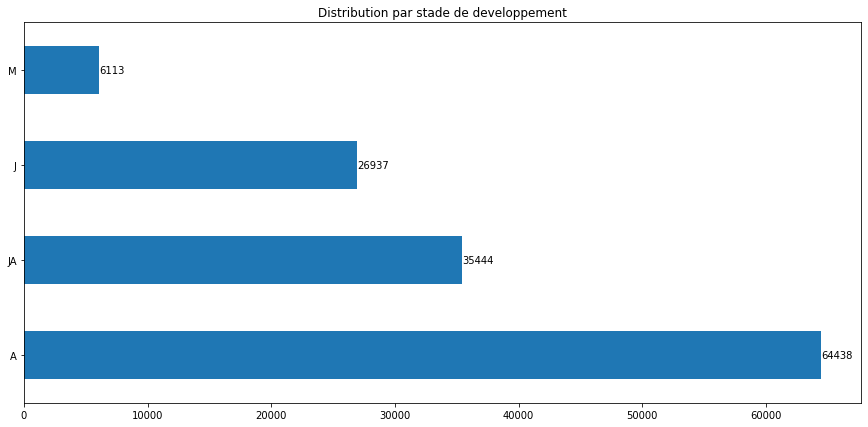

In [77]:
fig = plt.figure(figsize=(15,7))

ax = data['stade_developpement'].value_counts(dropna=True)[:25].plot(kind='barh', title="Distribution par stade de developpement")

for container in ax.containers:
    ax.bar_label(container)
    
plt.show()

#### Essayons de voir si l'on peut découvrir le sens des valeurs `J`, `JA`, `A` et `M`
Pour ce faire, je vais regarder les valeurs moyennes des colonnes `circonference_cm` et `hauteur_m` pour les différents stades de développement <br>**(en ne gardant que les valeurs jusqu'au quantile 0.99, pour éliminer simplement les grands outliers)**

In [78]:
for s in ['J','JA','A','M']:
    circonference = data[ data['stade_developpement'] == s ].circonference_cm.quantile(0.99).mean()
    hauteur = data[ data['stade_developpement'] == s ].hauteur_m.quantile(0.99).mean()
    print(f"Pour le stade de développement {s}, \non a une circonférence moyenne de {circonference:.2f}cm et une hauteur moyenne de {hauteur:.2f}m\n")

Pour le stade de développement J, 
on a une circonférence moyenne de 100.00cm et une hauteur moyenne de 12.00m

Pour le stade de développement JA, 
on a une circonférence moyenne de 150.00cm et une hauteur moyenne de 22.00m

Pour le stade de développement A, 
on a une circonférence moyenne de 259.00cm et une hauteur moyenne de 25.00m

Pour le stade de développement M, 
on a une circonférence moyenne de 449.00cm et une hauteur moyenne de 30.00m



On constate que les mesures sont de plus en plus grandes avec les différents stades d'évolutions.

#### Nous pouvons en faire un graphique pour ce soit plus explicite.
(Appliquons les limites réelles identifiées plus haut + 1/3 pour éviter d'être dérangé par les outliers.)

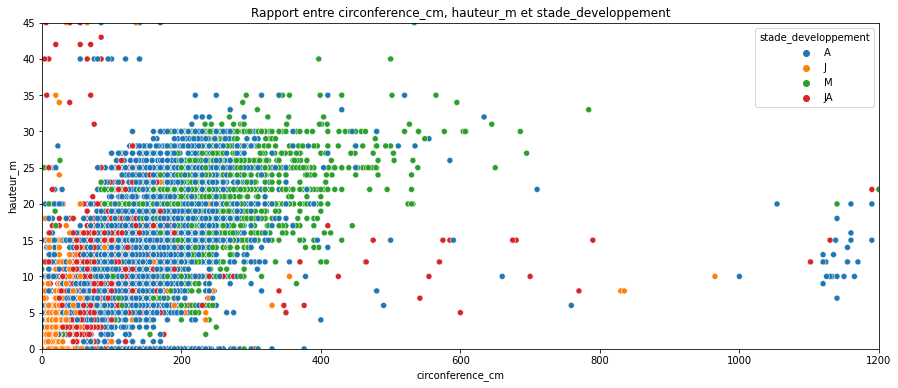

In [79]:
figure = plt.figure(figsize=(15,6))

max_circonference_cm = 800
max_hauteur_m = 30

ax = sns.scatterplot(data=data,x="circonference_cm",y="hauteur_m", hue='stade_developpement')
ax.set_title(f'Rapport entre circonference_cm, hauteur_m et stade_developpement')
plt.xlabel("circonference_cm")
plt.xlim(0, max_circonference_cm*1.5)
plt.ylabel("hauteur_m")
plt.ylim(0, max_hauteur_m*1.5)

plt.show()

Là encore la même idée se dégage, et on peut supposer que:
- `J` = Jeune
- `JA` = Jeune Adulte
- `A` = Adulte
- `M` = Mature

> On note au passage un lien fort entre les colonnes `circonference_cm` et `hauteur_m`

#### Enfin vérifions si il en manque.

In [80]:
data['stade_developpement'].isnull().sum()

67205

In [81]:
67205/200137*100

33.57949804383997

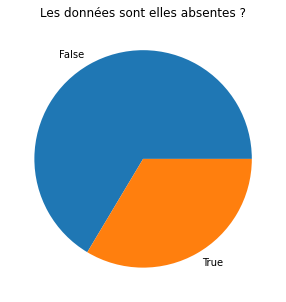

In [82]:
fig = plt.figure(figsize=[5,5])
check = data['stade_developpement'].isnull().value_counts()
plt.pie(list(check), labels=check.keys())
#plt.legend()
plt.title("Les données sont elles absentes ?")
plt.show()

On a donc visiblement des labels permettant d'indiquer le state dans lequel se trouve actuellement l'arbre.

Une fraction conséquente des valeurs ne sont pas renseignées, mais il devrait être possible de les imputer à partir des colonnes `espece`, `circonference_m` et `hauteur_m`

> **stade_developpement:** [text] > **[object]**<br>
Le stade de développpement de l'arbre; Jeune, Jeune Adulte, Adulte, Mature.

> `Recommandation:` Il convient de garder cette colonne, mais elle doit être traitée pour imputer un maximum de valeurs manquantes et supprimer le reste.

---

## `remarquable`

In [83]:
data['remarquable'].describe()

count   137039.00
mean         0.00
std          0.04
min          0.00
25%          0.00
50%          0.00
75%          0.00
max          1.00
Name: remarquable, dtype: float64

In [84]:
data['remarquable'].value_counts(dropna=False)

0.00    136855
NaN      63098
1.00       184
Name: remarquable, dtype: int64

Visiblement cette colonne ne propose que 3 valeurs; 0,1 ou nan.

On peut donc supposer que c'est en fait une colonne avec des valeurs `boolean` où 0 = False, 1 = True et `nan` correspond aux lignes non renseignées.

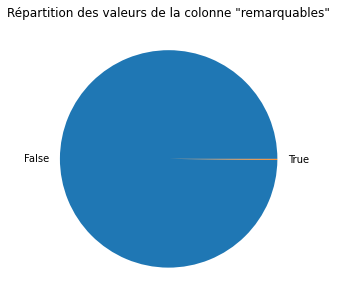

In [85]:
fig = plt.figure(figsize=[5,5])
check = data['remarquable'].value_counts(dropna=True)
plt.pie(list(check), labels={False, True})
#plt.legend()
plt.title("Répartition des valeurs de la colonne \"remarquables\"")
plt.show()

#### Enfin vérifions quelle proportion des données est manquante

In [86]:
63098/200137*100

31.527403728446014

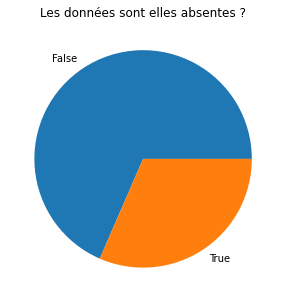

In [87]:
fig = plt.figure(figsize=[5,5])
check = data['remarquable'].isnull().value_counts()
plt.pie(list(check), labels=check.keys())
#plt.legend()
plt.title("Les données sont elles absentes ?")
plt.show()

D'après l'article "[L'arbre à Paris](https://www.paris.fr/pages/l-arbre-a-paris-199)", un arbre remarquable se distingue par sa singularité, sa morphologie, son identité ou encore son rôle social. Cette distinction lui permet d’entrer au panthéon du patrimoine naturel, culturel ou paysager.

Les valeurs de cette colonne indiquent visiblement si l'arbre en question est remarquable au regard de ces critères ou non. On a donc une colonne de valeurs boolennes.

> **remarquable:** [text] > **[float64]** > [bool]<br>
indique si l'arbre à quelque chose de remarquable ou non.

> `Recommandation:` Il convient de garder cette colonne, mais elle doit être traitée pour convertir les nan en False.

---

## `geo_point_2d_a`

In [88]:
data['geo_point_2d_a'].describe()

count   200137.00
mean        48.85
std          0.03
min         48.74
25%         48.84
50%         48.85
75%         48.88
max         48.91
Name: geo_point_2d_a, dtype: float64

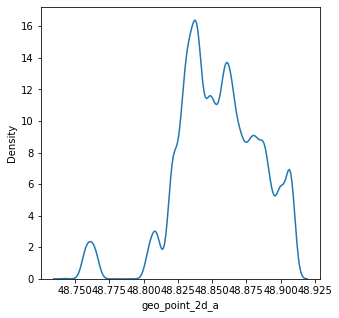

In [89]:
fig = plt.figure(figsize=(5,5))
sns.kdeplot(data.geo_point_2d_a )
plt.show()

#### Vérifions si il en manque.

In [90]:
data['geo_point_2d_a'].isnull().sum()

0

On a donc visiblement des valeurs continues dont la valeur oscille autour de 48.85 et qui sont censée être des repères géographiques.

Si l'on s'en réfère aux coordonnées GPS de Paris (latitude: 48.856614. longitude: 2.3522219 ), on peut en déduire qu'**il s'agit des données de latitude**.

La valeur minimale étant 48.74 et la valeur maximale étant 48.91, il ne semble pas y avoir de valeur aberrantes. Par ailleurs il ne manque aucune des valeurs, mais nous pourrions vérifier si certains couples (longitude, latitude) ne sont pas présents en plusieurs exemplaires.

> **geo_point_2d_a:** [geo_point_2d] > **[float64]**<br>
la latitude de l'emplacement de l'arbre.

> `Recommandation:` Il convient de garder cette colonne, mais il serait bon de vérifier les éventuels doublons des couples (longitude, latitude).

---

## `geo_point_2d_b`

In [91]:
data['geo_point_2d_b'].describe()

count   200137.00
mean         2.35
std          0.05
min          2.21
25%          2.31
50%          2.35
75%          2.39
max          2.47
Name: geo_point_2d_b, dtype: float64

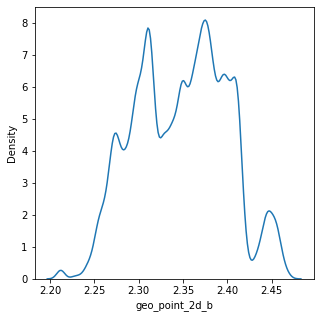

In [92]:
fig = plt.figure(figsize=(5,5))
sns.kdeplot(data.geo_point_2d_b)
plt.show()

#### Vérifions si il en manque.

In [93]:
data['geo_point_2d_b'].isnull().sum()

0

On a donc visiblement des valeurs continues dont la valeur oscille autour de 2.35 et qui sont censée être des repères géographiques.

Si l'on s'en réfère aux coordonnées GPS de Paris (latitude: 48.856614. longitude: 2.3522219 ), on peut en déduire qu'**il s'agit des données de longitude**.

La valeur minimale étant 2.21 et la valeur maximale étant 2.47, il ne semble pas y avoir de valeur aberrantes.
Par ailleurs il ne manque aucune des valeurs, mais nous pourrions vérifier si certains couples (longitude, latitude) ne sont pas présents en plusieurs exemplaires.

> **geo_point_2d_b:** [geo_point_2d] > **[float64]**<br>
la longitude de l'emplacement de l'arbre.

> `Recommandation:` Il convient de garder cette colonne, mais il serait bon de vérifier les éventuels doublons des couples (longitude, latitude).

---

## Les variables en résumé

> **id:** [int] > [int64]<br>
l'identifiant de l'arbre dans le jeu de donnée.

> **type_emplacement:** [text] > [object]<br>
le type d'emplacement (Arbres, Buissons, Fleurs...)
Mais toutes les lignes de cette colonne ont pour valeur 'Arbre'.

> **domanialite:** [text] > [object]<br>
le type de lieu auquel appartient l'arbre.

> **arrondissement:** [text] > [object]<br>
l'arrondissement dans lequel se trouve l'arbre. Il en existe donc 25 au total.

> **complement_addresse:** [text] > [object]<br>
des informations supplémentaires pour faciliter la localisation de l'arbre; un numéro de rue, un point de repère ...

> **numero:** [text] > [float64]<br>
le numéro de rue auquel se trouve l'arbre.<br>
Mais toutes les lignes sont vides.

> **lieu:** [text] > [object]<br>
l'adresse à laquelle on peut trouver l'arbre.<br>
Le format peut varier.

> **id_emplacement:** [text] > [object]<br>
l'identifiant de l'emplacement.

> **libelle_francais:** [text] > [object]<br>
le nom commun en Français, de l'espèce de l'arbre.

> **genre:** [text] > [object]<br>
le genre de l'arbre.<br>
Le genre étant un ensemble d'espèces ayant en commun plusieurs caractères similaires.
    
> **espece:** [text] > [object]<br>
le nom scientifique de l'espèce de l'arbre.

> **variete:** [text] > [object]<br>
la varité de l'arbre.<br>
Le terme variété vient différencier les plantes d’une même espèce.

> **circonference_cm:** [int] > [int64]<br>
la circonférence de l'arbre (en centimètres).

> **hauteur_m:** [int] > [int64]<br>
la hauteur de l'arbre (en mètres).

> **stade_developpement:** [text] > [object]<br>
Le stade de développpement de l'arbre; Jeune, Jeune Adulte, Adulte, Mature

> **remarquable:** [text] > [float64] > [bool]<br>
indique si l'arbre à quelque chose de remarquable *(singularité, morphologie, identité, rôle social)* ou non.

> **geo_point_2d_a:** [geo_point_2d] > [float64]<br>
la latitude de l'emplacement de l'arbre.

> **geo_point_2d_b:** [geo_point_2d] > [float64]<br>
la longitude de l'emplacement de l'arbre.

## Les variables à retenir

> ~~**id:**~~ > Non

> ~~**type_emplacement:**~~ > Non

> **domanialite:** > Oui, mais il faut supprimer ou imputer la ligne problèmatique.

> **arrondissement:** > Oui

> ~~**complement_addresse:**~~ > Non, ou alors en complément de la colonne `lieu`.

> ~~**numero:**~~ > Non

> **lieu:** > Oui, mais il faut la retravailler pour la rendre plus pertinente; suppression des séparateurs, séparations des numéros de rues quand ils sont présents...

> ~~**id_emplacement:**~~ > Non, sauf si l'on parvient à identifier le référentiel des emplacement.

> **libelle_francais:** > Oui, quoi qu'il puisse être redondant avec d'autres colonnes comme `espece`. Et il faut imputer certaines valeurs.

> **genre:** > Oui. Mais il manque quelques valeurs, qui doivent être supprimées ou imputées.
    
> **espece:** > Oui. Mais il manque quelques valeurs, qui doivent être supprimées ou imputées.

> ~~**variete:**~~ > Non. Ce serait intéressant de l'avoir pour être plus précis, mais il manque vraiment beaucoup de lignes et elle présente certainement beaucoup de corrélation avec d'autres colonnes (à vérifier).

> **circonference_cm:** > Oui. Mais il faut traiter les valeurs aberrantes.

> **hauteur_m:** > Oui. Mais il faut traiter les valeurs aberrantes.

> **stade_developpement:** > Oui. Mais il faut imputer un maximum de valeurs manquantes et supprimer le reste.

> **remarquable:** > Oui. Mais il faut remplacer les nan par des False (il semble difficile d'imputer les valeurs de cette colonne)

> **geo_point_2d_a:** > Oui.

> **geo_point_2d_b:** > Oui.

In [94]:
vars_numerical = ['circonference_cm', 'hauteur_m', 'geo_point_2d_a', 'geo_point_2d_b', 'remarquable']
vars_categorical = ['domanialite', 'arrondissement', 'lieu', 'lieu_split0', 'libelle_francais', 'genre', 'espece', 'stade_developpement']
vars_drop = ['id', 'numero', 'type_emplacement', 'complement_addresse', 'id_emplacement', 'variete']

## 3.2 Analyse multivariée <a class="anchor" id="P02_multivariate"></a>

Les analyses multivariées ont pour vocation de mettre en évidence des informations sur les relations entre variables. Mais sans objectif on peut croiser beaucoup de données sans vraiment savoir ce que l'on cherche...

Voici donc les objectifs pour lesquels il serait utile d'avoir des informations de ce type.
1. Pour imputer les colonnes `libelle_francais`, et `espece`, il serait intéressant de découvrir leurs relations avec les autres colonnes.
2. Pour imputer la colonne `remarquable`, il serait intéressant de voir si certaines colonnes peuvent raisonnablement être utilisées comme base.
3. Pour organiser des tournées optimisées, il serait intéressant de voir quelles colonnes ont une relation forte avec des `critères géographiques`.

---

### Commençons par vérifier les indices de corrélation entre les variables numériques. <a class="anchor" id="P03_correlation_num"></a>

Il existe plusieurs types de relations entre des variables numériques. Par exemple les rélations linéaires ou encore les relations monotones.
- Dans une relation linéaire, les variables se déplacent dans la même direction à un rythme constant.
- Dans une relation monotone, les variables ont tendance à se déplacer dans la même direction relative, mais pas nécessairement à un rythme constant.


Pour ces deux mesures les valeurs peuvent aller de -1 à 1 (inclus):
- -1 indique une relation forte dans le sens inverse (corrélation négative)
- +1 indique une relation forte dans le même sens (corrélation positive)
- 0  indique qu'il n'y a pas de relation.

Calculons donc les deux pour voir si quelque chose s'en dégage.

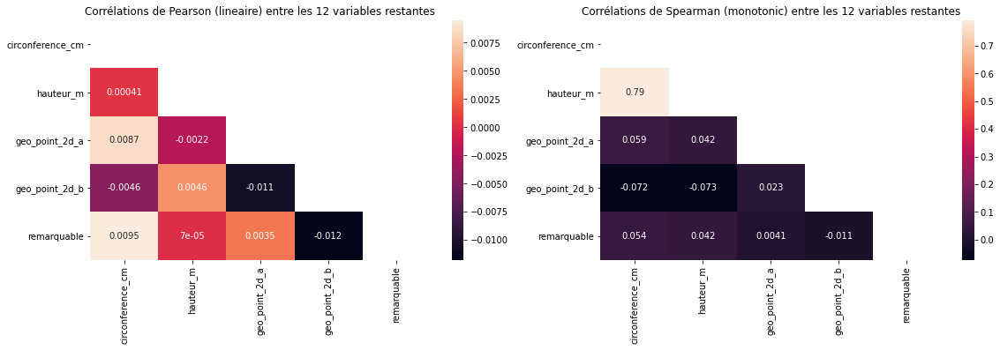

In [95]:
fig = plt.figure(figsize=(19,5))

plt.subplot(1,2,1)
corr= data[vars_numerical].corr(method="pearson")
matrix = np.triu(corr)
ax = sns.heatmap(corr, annot=True, mask=matrix)
ax.set_title('Corrélations de Pearson (lineaire) entre les 12 variables restantes')

plt.subplot(1,2,2)
corr= data[vars_numerical].corr(method="spearman")
matrix = np.triu(corr)
ax = sns.heatmap(corr, annot=True, mask=matrix)
ax.set_title('Corrélations de Spearman (monotonic) entre les 12 variables restantes')

plt.show()

Si la matrice de corrélation lineaire (pearson) ne semble pas indiquer de relation forte entre les variables (toutes les valeurs sont très basses), il n'en est pas de même avec la matrice de corrélation monotone (spearman).

En effet, sur cette seconde matrice on constate une **forte liason entre les colonnes `circonference_cm` et `hauteur_m`**, ce qui n'a rien de vraiment surprenant *(un arbre grandi plus vite en hauteur qu'en circonference dans un premier temps, puis c'est l'inverse plus tard)*. En revanche aucune autre relation marquante ne semble se dégager entre ces quelques variables.

---

### Ensuite vérifions les indices de corrélation entre les variables nominales. <a class="anchor" id="P03_correlation_nom"></a>

Pour ce faire, nous allons utiliser le test V de Cramer.<br>
C'est une mesure d'association entre deux variables nominales, qui est basée sur le Chi-squared de Pearson.<br>
Elle donne une valeur comprise entre 0 et +1 (inclus)
- 0 : il n'y a visiblement aucune relation entre les variables.
- 1 : il y a une relation parfaite entre les variables (on ne peut atteindre 1 que lorsque chaque variable est complètement déterminée par l'autre).

In [96]:
import scipy.stats as ss

def cramers_v(confusion_matrix):
    """ calculate Cramers V statistic for categorial-categorial association.
        uses correction from Bergsma and Wicher,
        Journal of the Korean Statistical Society 42 (2013): 323-328
    """
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))


corr = []
for v1 in vars_categorical:
    corr2 = []
    for v2 in vars_categorical:
        confusion_matrix = pd.crosstab(data[v1], data[v2])
        cramer_score = cramers_v(confusion_matrix.values)
        #print(f"{v1} / {v2} -> {cramer_score}")
        corr2.append(cramer_score)
    corr.append(corr2)
    
corr = pd.DataFrame(corr)
corr.index = corr.columns = vars_categorical

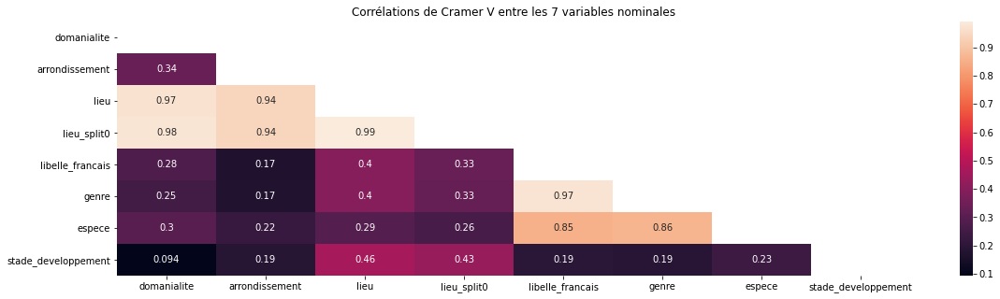

In [97]:
fig = plt.figure(figsize=(19,5))

matrix = np.triu(corr)
ax = sns.heatmap(corr, annot=True, mask=matrix)
ax.set_title('Corrélations de Cramer V entre les 7 variables nominales')

plt.show()

On remarque qu'il y a **deux groupes majeurs de corrélation**, qui ne sont finalement pas très surprenants:
- D'un coté on note une forte corrélation entre les colonnes `lieu` ou `lieu_split0` et `domanialite`.
- De l'autre, on remarque une forte corrélation entre les colonnes `genre`, `libelle_francais` et `espece`.

D'un autre coté, on note des corrélation moyennes qui sont plus surprenantes:
- Il semble qu'il y ai un certain lien entre la `domanialite` et les 3 colonnes `genre`, `libelle_francais` et `espece` indiquant le type d'arbre.
- De même, on constate un certain lien entre `lieu` ou `lieu_split0` et les 3 colonnes `genre`, `libelle_francais` et `espece`.
- En revanche le type d'arbre semble moins lié à l'`arrondissement`.

On a donc des concentrations d'especes ou de genre d'arbre à certaines adresses (ce qui n'est pas incohérent puisqu'il y a souvent des regroupements d'arbres similaires pour créer une harmonie visuelle), mais ça ne semble pas particulièrement lié aux arrondissements.

### A présent répondons aux objectifs fixés <a class="anchor" id="P03_objectifs"></a>

Pour rappel, voici donc les objectifs pour lesquels il serait utile d'avoir des informations de ce type.
1. Pour imputer les colonnes `libelle_francais`, et `espece`, il serait intéressant de découvrir leurs relations avec les autres colonnes.
2. Pour imputer la colonne `remarquable`, il serait intéressant de voir si certaines colonnes peuvent raisonnablement être utilisées comme base.
3. Pour organiser des tournées optimisées, il serait intéressant de voir quelles colonnes ont une relation forte avec des `critères géographiques`.

### Objectif 1 : étudier la relation entre `libelle_francais`, `espece`, `genre` et les autres colonnes

Comme nous l'avons vu un peu plus haut ces trois variables sont visilement assez liées (avec des indices de corrélations au test V de Cramer allant de 0.86 à 0.97). Ce n'est pas le cas des autres colonnes.

> Il parait donc raisonnable de s'appuyer sur ces colonnes pour organiser des imputations entre elles.



#### Regardons combien nous avons de `libelle_francais` par  `genre`.

In [98]:
data[['libelle_francais','genre']].groupby('genre').libelle_francais.nunique().describe()

count   175.00
mean      1.16
std       1.26
min       0.00
25%       1.00
50%       1.00
75%       1.00
max      17.00
Name: libelle_francais, dtype: float64

> On constate que l'on a quasiement 1 `libelle_francais` par `genre` *(d'où la corrélation de 0.97)*
> 
> Il serait donc judicieux d'imputer les valeurs manquantes de `libelle_francais` en s'appuyant sur la colonne `genre`
---

#### Regardons combien nous avons d'`espece` par `genre`.

In [99]:
data[['espece','genre']].groupby('genre').espece.nunique().describe()

count   175.00
mean      5.11
std       7.89
min       0.00
25%       1.00
50%       2.00
75%       5.00
max      50.00
Name: espece, dtype: float64

#### Et d'`espece` par `libelle_francais`

In [100]:
data[['espece', 'libelle_francais']].groupby('libelle_francais').espece.nunique().describe()

count   192.00
mean      3.74
std       5.85
min       0.00
25%       1.00
50%       2.00
75%       4.00
max      46.00
Name: espece, dtype: float64

> Cette fois on remarque qu'il sera un peu plus hasardeux d'imputer les valeurs manquantes de la colonne `espece` car dans les deux cas on a en moyenne 4 *(3.74)* ou 5 *(5.11)* correspondances possible.
>
> Avec des indices de corrélations autour de 0.85 et 0.86, les deux restent à priori un bon choix. Alors autant choisir de travailler avec la colonne qui présente le moins de correspondances possible pour minimiser les chances d'erreur.
>
> Il serait donc judicieux d'imputer les valeurs manquantes d'`espece` en s'appuyant sur la colonne `libelle_francais`.

### Objectif 2 : étudier la relation entre `remarquable` et les autres colonnes

D'après les matrics de corrélation calculées plus haut, la colonne `remarquable` ne semble pas particulièrement liée aux autres colonnes numériques. Mais il y a très peu d'arbres remarquables dans le jeu de données, donc il serait intéressant de l'explorer de façon plus visuelle.

#### Regardons si le fait d'être `remarquable` peut être lié à la `circonference_cm` ou à la `hauteur_m`.
Appliquons les limites réelles identifiées plus haut + 1/3 pour éviter d'être dérangé par les outliers.

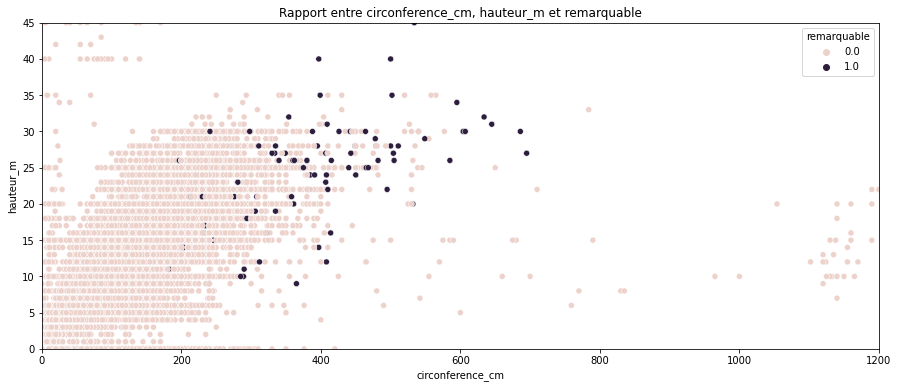

In [101]:
figure = plt.figure(figsize=(15,6))

max_circonference_cm = 800
max_hauteur_m = 30

ax = sns.scatterplot(data=data,x="circonference_cm",y="hauteur_m", hue='remarquable')
ax.set_title(f'Rapport entre circonference_cm, hauteur_m et remarquable')
plt.xlabel("circonference_cm")
plt.xlim(0, max_circonference_cm*1.5)
plt.ylabel("hauteur_m")
plt.ylim(0, max_hauteur_m*1.5)

plt.show()

> On peut noter une certaine corrélation entre les dimensions des abres et le fait qu'ils soient remarquables.
>
> Mais c'est insuffisant pour imputer les valeurs manquantes de `remarquable` à partir de `circonference_cm` et/ou `hauteur_m`.

---

#### Regardons si le fait d'être `remarquable` est lié au `stade_developpement`

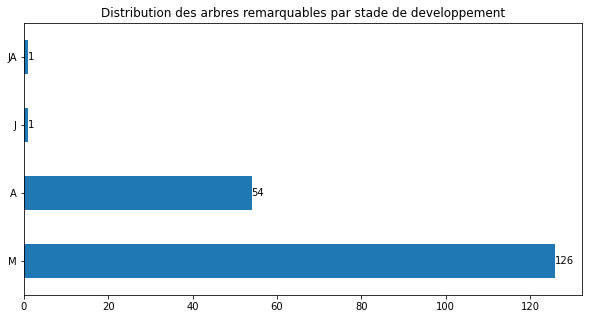

In [102]:
figure = plt.figure(figsize=(10,5))

select = data[ data['remarquable'] == 1.0 ].stade_developpement.value_counts()
ax = select.plot(kind='barh', title="Distribution des arbres remarquables par stade de developpement")

for container in ax.containers:
    ax.bar_label(container)

plt.show()

> Là encore on note que les abres `remarquables` sont majoritairement au `stade_developpement` Adulte ou Mature.

#### Mais quelle part des arbres arrivés au `stade_developpement` Adulte et Mature sont `remarquable` ?

<Figure size 720x360 with 0 Axes>

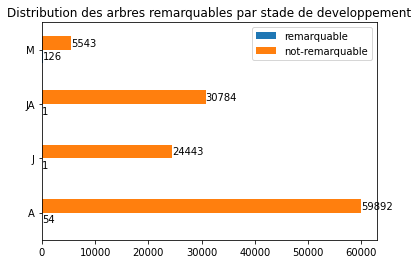

In [103]:
figure = plt.figure(figsize=(10,5))

r1 = data[ data['remarquable'] == 1.0 ].stade_developpement.value_counts()
r0 = data[ data['remarquable'] == 0.0 ].stade_developpement.value_counts()
select = pd.DataFrame({'remarquable': r1, 'not-remarquable': r0})

ax = select.plot(kind='barh', title="Distribution des arbres remarquables par stade de developpement")

for container in ax.containers:
    ax.bar_label(container)
    
plt.show()

> Donc les arbres `remarquables` ne sont qu'une toute petite fractions des arbres qui sont aux `stade_developpement` Adulte ou Mature...
>
> Il parait donc là encore difficile d'imaginer la colonne `remarquable` sur cette base.
>
> La meilleure solution semble être d'imputer un `False` à toutes les valeurs manquantes pour les considérer comme **non** `remarquable`.

#### Regardons à présent si ces arbres `remarquables` sont plus dans certains secteurs de Paris que d'autres.

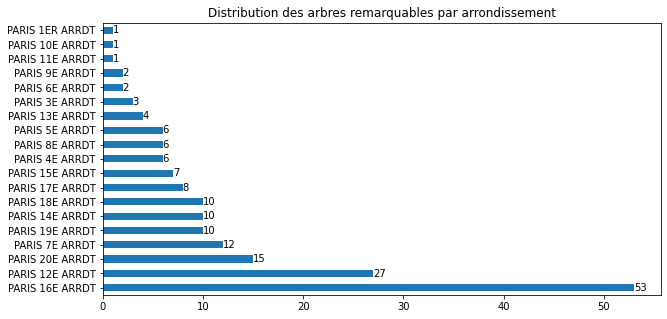

In [104]:
figure = plt.figure(figsize=(10,5))

select = data[ data['remarquable'] == 1.0 ].arrondissement.value_counts()
ax = select.plot(kind='barh', title="Distribution des arbres remarquables par arrondissement")

for container in ax.containers:
    ax.bar_label(container)

plt.show()

> Certains arrondissements n'apparaissent pas *(PARIS 2E ARRDT, VAL-DE-MARNE, SEINE-SAINT-DENIS, HAUTS-DE-SEINE, BOIS DE BOULOGNE, BOIS DE VINCENNES)* et n'ont donc aucun arbre `remarquable` enregistré.
>
> A l'inverse les 12 et 16 arrondissements ou encore le centre (les 4 premiers arrondissements mis ensemble) sont beaucoup mieux dotés que les autres.
> 
> Mais il faut considèrer que le bois de Vincennes est rattaché au 12ème arrondissement, et que le bois de Boulogne est rataché au 16ème arrondissement. Il se pourrait donc que les arbres `remarquables` des arrondissements *BOIS DE BOULOGNE* et *BOIS DE VINCENNES* aient été mis dans *PARIS 12E ARRDT* et *PARIS 16E ARRDT*.

#### Vérifions donc sur une carte où se trouvent vraiment les arbres...

Pour ce faire, nous allons utiliser Folium (mais on aurait aussi pu utiliser Plotly Express)

In [105]:
import folium
from folium.plugins import FastMarkerCluster

In [106]:
# Ici on crée une fonction définissant le rendu des pop-up de détail des arbres sur la carte Folium
callback = ('function (row) {' 
                'var marker = L.marker(new L.LatLng(row[0], row[1]), {color: "red"});'
                'var genre = row[2];'
                'var espece = row[3];'
                'var libelle_francais = row[4];'
                'var circonference = row[5];'
                'var hauteur =  row[6];'
                'var stade_developpement = row[7];'
                'var remarquable = row[8];'
                'var icon = L.AwesomeMarkers.icon({'
                "icon: 'tree-conifer',"
                "iconColor: 'white',"
                "markerColor: 'green',"
                "prefix: 'glyphicon',"
                "extraClasses: 'fa-rotate-0'"
                    '});'
                'marker.setIcon(icon);'
                "var popup = L.popup({maxWidth: '300'});"
                "const display_text = {text: '<table><tbody><tr><td><b>Genre</b></td><td>'+genre+'</td></tr><tr><td><b>Espèce</b></td><td>'+espece+'</td></tr><tr><td><b>Libellé</b></td><td>'+libelle_francais+'</td></tr><tr><td><b>Circonférence (cm)</b></td><td>'+circonference+'</td></tr><tr><td><b>Hauteur (m)</b></td><td>'+hauteur+'</td></tr><tr><td><b>Stade</b></td><td>'+stade_developpement+'</td></tr><tr><td><b>Remarquable</b></td><td>'+remarquable+'</td></tr></tbody></table>'};"
                "var mytext = $(`<div id='mytext' class='display_text' style='width: 100.0%; height: 100.0%;'> ${display_text.text}</div>`)[0];"
                "popup.setContent(mytext);"
                "marker.bindPopup(popup);"
                'return marker};')

In [107]:
# Ici on instantie Folium avec des coordonnées de départ (La mairie de Paris) et un zoom raisonnable
map_remarquable = folium.Map(location=["48.856614", "2.3522219"], zoom_start=12)

# Puis on ajoute chacun des points d'intéret sur notre map (dans ce cas, les arbres remarquables)
select = data[data['remarquable'] == 1.0]
map_remarquable.add_child(FastMarkerCluster(
    
        select[["geo_point_2d_a", "geo_point_2d_b",
                "genre", "espece", "libelle_francais", 
                "circonference_cm", "hauteur_m", 
                "stade_developpement", "remarquable"]].values.tolist(), 
        showCoverageOnHover = True,
        spiderfyOnMaxZoom = False,
        disableClusteringAtZoom = 1,
        callback = callback ))

# Et on l'affiche
map_remarquable

> En effet, on constate que les 12ème et 16ème arrondissement on plus d'arbres parcqu'ils sont rattachés à des bois.
>
> Bien que quelques regroupements semblent se dégager, on retrouve en fait des arbres remarquables dans un peu tous les secteurs de Paris, et on constate qu'ils sont essentiellement dans les Jardins de la capitale (une plus petite fraction semblent être dans les rues ou les cimetières)

#### Vérifions ce dernier constat avec un graphique en barres.

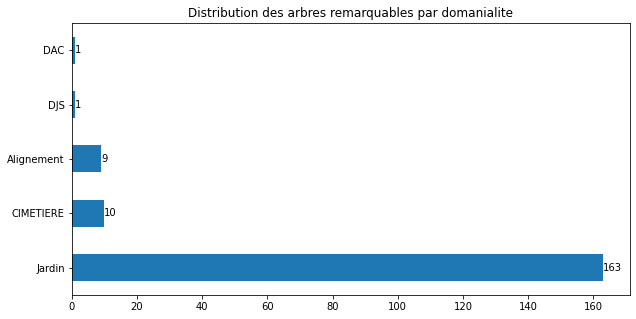

In [108]:
figure = plt.figure(figsize=(10,5))

select = data[ data['remarquable'] == 1.0 ].domanialite.value_counts()
ax = select.plot(kind='barh', title="Distribution des arbres remarquables par domanialite")

for container in ax.containers:
    ax.bar_label(container)

plt.show()

### Objectif 3 : voir si l'on peut trouver une relation entre les divers critères géographiques et des critères intéressants au regard des différentes actions d'entretiens présentées en début de document.

Déterminer des secteurs géographiques qui auraient une certaines corrélation avec les dimensions des arbres seraient bien utile, car elle permettrait d'orgniser des tournées d'arrosage ou d'élagage etc. en fonction de ces critères.

Mais, au regard des matrices de corrélation de Pearson et Spearman, il n'y a **visiblement pas de lien particulier** entre les colonnes de coordonnées GPS (`geo_point_2d_a`, `geo_point_2d_b`) et les dimensions (`circonference_cm`, `hauteur_m`) des arbres.

#### Regardons si la taille des arbres est liée à l'`arrondissement`, au `lieu` ou à la `domanialite`.

In [109]:
data_corr = data.copy()

In [110]:
from sklearn.preprocessing import LabelEncoder

Pour permettre de vérifier simplement la corrélation entre les variables numériques et les variables nominales, nous allons utiliser un LabelEncoder sur les colonnes nominales qui nous intéressent puis calculer à nouveau les corrélations linéaires et monotones.<br>(On pourrait aussi calculer $\eta^2$ à partir d'une ANOVA, mais je préfère rester simple sur cette EDA)

In [111]:
cats = ['arrondissement', 'lieu', 'lieu_split0', 'domanialite']

for cat in cats:
    encoder=LabelEncoder()
    encoder.fit(data_corr[cat])
    data_corr[f"{cat}_enc"]=encoder.transform(data_corr[cat])

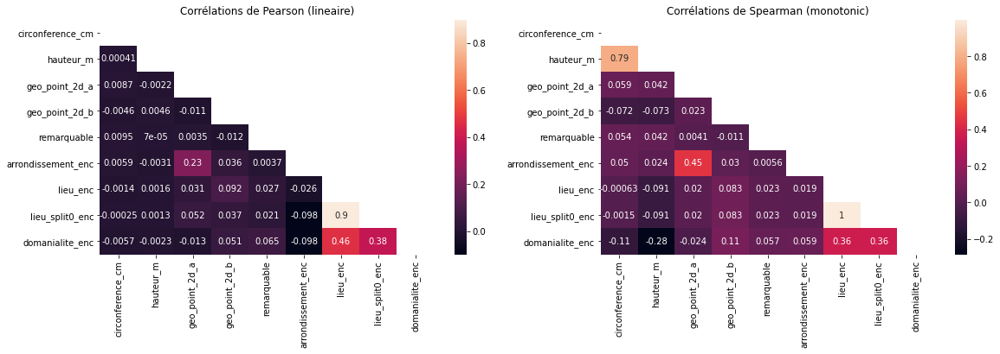

In [112]:
fig = plt.figure(figsize=(19,5))

select = data_corr[[*vars_numerical, *[f"{v}_enc" for v in cats]]]

plt.subplot(1,2,1)
corr= select.corr(method="pearson")
matrix = np.triu(corr)
ax = sns.heatmap(corr, annot=True, mask=matrix)
ax.set_title('Corrélations de Pearson (lineaire)')

plt.subplot(1,2,2)
corr= select.corr(method="spearman")
matrix = np.triu(corr)
ax = sns.heatmap(corr, annot=True, mask=matrix)
ax.set_title('Corrélations de Spearman (monotonic)')

plt.show()


> Il n'y a visiblement **pas de corrélation** particulière entre l'une des variables géographique (`geo_point_2d_a`, `geo_point_2d_b`, `arrondissement`, `domanialite`, `lieu`) et les dimensions (`circonference_cm`, `hauteur_m`) des arbres.

---

#### Regardons si l'`espece`, le `genre` ou le `libelle_francais` des arbres est liée à l'`arrondissement`, au `lieu` à la `domanialite`. ou `geo_point_2d_a` et  `geo_point_2d_b`.

In [113]:
data_corr = data.copy()

In [114]:
cats = ['espece','genre','libelle_francais','arrondissement', 'lieu', 'domanialite', 'geo_point_2d_a', 'geo_point_2d_b']

for cat in cats:
    encoder=LabelEncoder()
    encoder.fit(data_corr[cat])
    data_corr[f"{cat}_enc"]=encoder.transform(data_corr[cat])

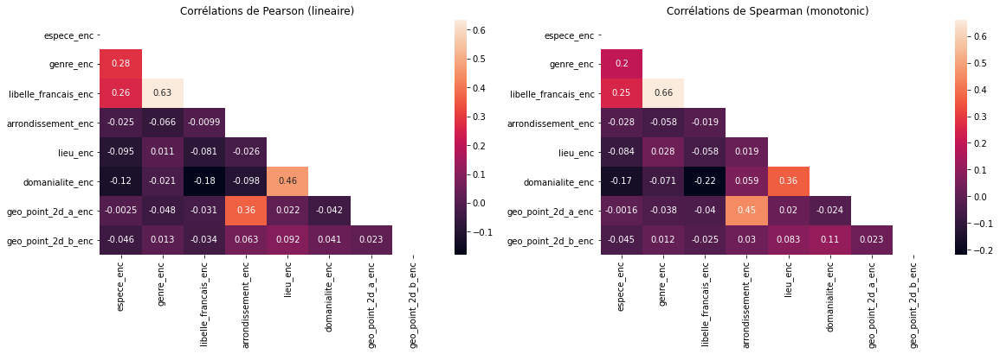

In [115]:
fig = plt.figure(figsize=(19,5))

select = data_corr[[*[f"{v}_enc" for v in cats]]]

plt.subplot(1,2,1)
corr= select.corr(method="pearson")
matrix = np.triu(corr)
ax = sns.heatmap(corr, annot=True, mask=matrix)
ax.set_title('Corrélations de Pearson (lineaire)')

plt.subplot(1,2,2)
corr= select.corr(method="spearman")
matrix = np.triu(corr)
ax = sns.heatmap(corr, annot=True, mask=matrix)
ax.set_title('Corrélations de Spearman (monotonic)')

plt.show()

> Mais là encore, on ne note pas de corrélation particulière entre l'une des variables géographique (`geo_point_2d_a`, `geo_point_2d_b`, `arrondissement`, `domanialite`, `lieu`) et les variables `genre`, `espece` ou `libelle_francais`.

> On note en revanche une corrélation moyenne entre l'arrondissement et la latitutde, que nous n'avions pas mis en évidence jusque là.

A présent que nous connaissons un peu mieux notre jeu de données, il est temps de le nettoyer.

# 4. Nettoyage & imputation des données <a class="anchor" id="P04"></a>

Commençons par faire une copie de notre jeu de données.

In [416]:
data_clean = data.copy()

## Suppression des colonnes inutiles <a class="anchor" id="P04_dropuseless"></a>

In [417]:
data_clean = data_clean.drop(vars_drop, axis='columns')

In [418]:
data_clean.head(3)

,domanialite,arrondissement,lieu,libelle_francais,genre,espece,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b,lieu_split0
0,Jardin,PARIS 7E ARRDT,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,Marronnier,Aesculus,hippocastanum,20,5,NaN,0.00,48.86,2.32,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E
1,Jardin,PARIS 7E ARRDT,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,If,Taxus,baccata,65,8,A,NaN,48.86,2.32,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E
2,Jardin,PARIS 7E ARRDT,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,If,Taxus,baccata,90,10,A,NaN,48.86,2.32,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E


## Renommage des colonnes <a class="anchor" id="P04_renamecols"></a>
On va renommer les colonnes `geo_point_2d_a` et `geo_point_2d_b` en `latitude` et `longitude` pour faciliter le travail et la lecture.

In [419]:
data_clean = data_clean.rename(columns={'geo_point_2d_a':'latitude', 'geo_point_2d_b':'longitude'})
vars_quantitatives = ['circonference_cm', 'hauteur_m', 'latitude', 'longitude']

## Détection et suppression des valeurs aberrantes <a class="anchor" id="P04_outliers"></a>

Utilisons les boites à moustache pour mieux visualiser les valeurs aberrantes des variables numériques.

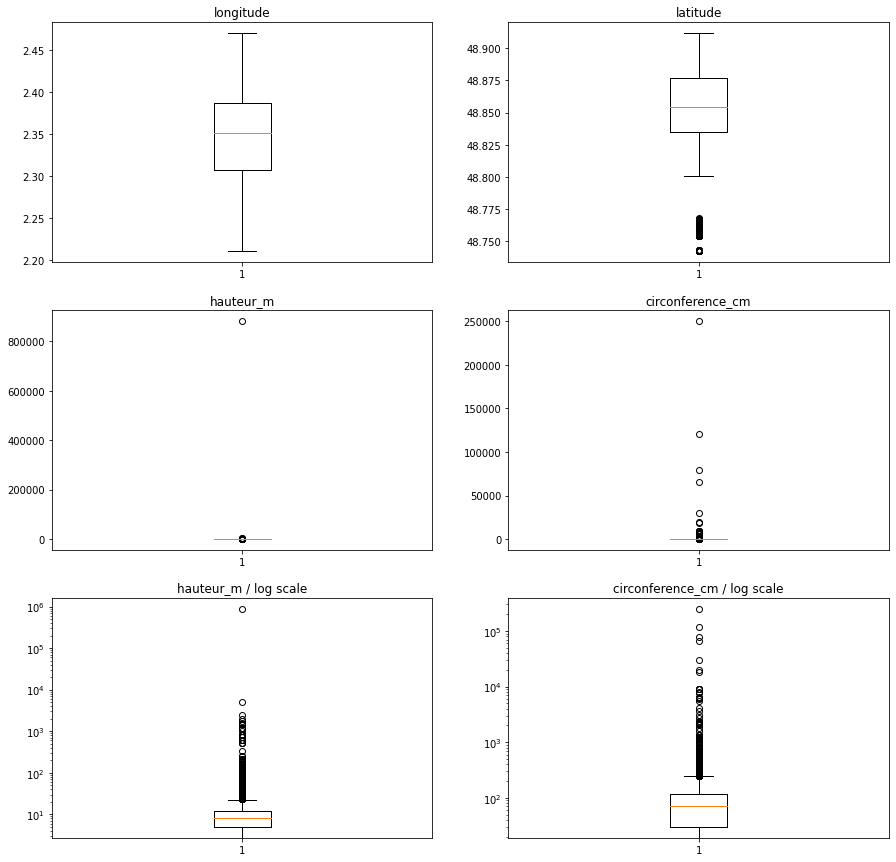

In [420]:
fig = plt.figure(figsize =(15, 15))

for i, v in enumerate(reversed(vars_quantitatives)):
    ax = plt.subplot(3, 2, i+1)
    ax.boxplot(data_clean[v])
    plt.title(v)
    
for i, v in enumerate(reversed(vars_quantitatives[:2])):
    ax = plt.subplot(3, 2, i+5)
    ax.set_yscale('log')
    ax.boxplot(data_clean[v])
    plt.title(f"{v} / log scale")

plt.show()

In [421]:
data_clean[vars_quantitatives].describe().T

,count,mean,std,min,25%,50%,75%,max
circonference_cm,200137.00,83.38,673.19,0.00,30.00,70.00,115.00,250255.00
hauteur_m,200137.00,13.11,1971.22,0.00,5.00,8.00,12.00,881818.00
latitude,200137.00,48.85,0.03,48.74,48.84,48.85,48.88,48.91
longitude,200137.00,2.35,0.05,2.21,2.31,2.35,2.39,2.47


#### circonference_cm
Les valeurs `min` (0 cm) et `max` (250255 cm) ne sont pas logiques.<br>
Cette idée est renforcée par le fait que 75% des arbres mesurent 115 cm ou moins de circonférence.

#### hauteur_m
Les valeurs `min` (0 m) et `max` (881818 m) ne sont pas logiques.<br>
Cette idée est renforcée par le fait que 75% des arbres mesurent 12 mètres ou moins de hauteur.

#### latitude
Les valeurs ne semblent pas aberrantes.

#### longitude
Les valeurs ne semblent pas aberrantes.


> **Il convient donc de supprimer les valeurs abérrantes sur `circonference_cm` et `hauteur_m`.**

---

### Selection des valeurs abérrantes par multiple de quantiles
On considère en général que les outliers sont les points qui tombent en dehors de valeurs qui valent 1.5 x l'écart inter-quantiles.<br> (i.e.: [Identifier les valeurs aberrantes dans une série statistique](https://fr.khanacademy.org/math/statistics-probability/summarizing-quantitative-data/box-whisker-plots/v/judging-outliers-in-a-dataset))
- ainsi les valeurs max valent `Q3+1.5*(Q3-Q1)`
- et les valeurs min valent `Q1-1.5*(Q3-Q1)`

In [422]:
# On calcul les premier et troisième quantiles, puis l'écart inter-quantiles
Q1 = data_clean[['circonference_cm','hauteur_m']].quantile(0.25)
Q3 = data_clean[['circonference_cm','hauteur_m']].quantile(0.75)
EI = Q3-Q1

# Puis on calcul les valeurs maximum et minimum
V_max = Q3 + 1.5*EI
V_min = Q1 - 1.5*EI

print(f"MIN:\n{V_min}\n")
print(f"MAX:\n{V_max}")

MIN:
circonference_cm   -97.50
hauteur_m           -5.50
dtype: float64

MAX:
circonference_cm   242.50
hauteur_m           22.50
dtype: float64


Pour les valeurs `min`, on constate que ce n'est pas cohérant et qu'il vaudrait mieux prendre 0 ou une valeur légèrement supérieure.

Pour les valeurs `max`, on constate que c'est totalement cohérant. Mais si l'on s'en réfère aux deux articles suivants ([Article 1](https://agriculture.gouv.fr/le-plus-grand-arbre-de-paris-veille-sur-le-78-rue-de-varenne) et [Article 2](https://www.pariszigzag.fr/secret/lieux-insolites/arbres-remarquables-paris)) les valeurs maximum attendues sont d'environ **800cm de circonférence et 30m de hauteur**.

#### Affichons donc un plot de la répartition des valeurs.
Pour que cette méthode basée sur l'écart inter-quantile soit efficace, il faudrait avoir une distribution normale.

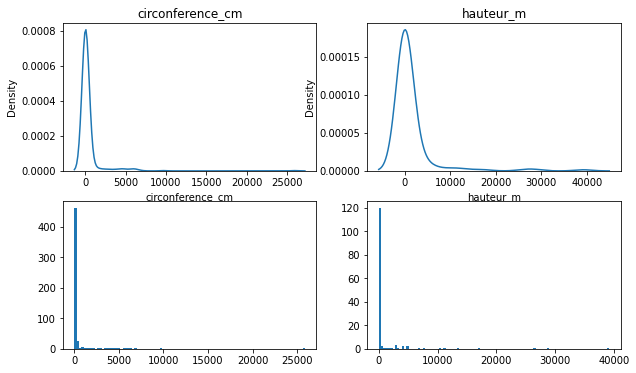

In [423]:
fig = plt.figure(figsize=(10, 6))

plt.subplot(2,2,1)
sns.kdeplot(data.circonference_cm.value_counts())
plt.title("circonference_cm")
plt.subplot(2,2,2)
sns.kdeplot(data.hauteur_m.value_counts())
plt.title("hauteur_m")

plt.subplot(2,2,3)
plt.hist(data.circonference_cm.value_counts(), bins=100)
#plt.xscale("log")

plt.subplot(2,2,4)
plt.hist(data.hauteur_m.value_counts(), bins=100)
#plt.xscale("log")

plt.show()

Comme attendu, la distribution est très biaisée et la méthode de détection des valeurs aberrantes basée sur l'écart inter-quantile ne semble pas adaptée dans ce cas.

Nous pouvons donc chercher à utiliser une méthode plus sophistiquée comme le KNN, ou simplement utiliser les données connues.

---

### Selection des valeurs abérrantes en s'appuyant sur les valeurs limites réelles connues
On a vu que la **circonférence maximale est de 800cm** et la **hauteur maximale est de 30m**.<br> Mais qu'en est il des valeurs minimales ? 

#### Circonference minimale
Sur le [site de la ville de Paris](https://www.paris.fr/pages/l-arbre-a-paris-199), on nous indique que les arbres sont cultivés en pépinière en moyenne **8 à 10 ans** avant d’être plantés en ville.

Et si l'on se fie [à ce site](https://www.promessedefleurs.com/conseil-plantes-jardin/ficheconseil/calculer-age-arbre), on peut avoir une approximation de l'âge de l'arbre à partir de sa circonférence... donc en retournant la formule, on peut avoir une apprimation de la circonférence à partir de l'age. **`circonference = AGE x FACTEUR / PI`** *(le FACTEUR moyen vaut 2.5, mais il évolue entre 2 et 3 selon les espèces)*.

Ainsi, on peut estimer que la **circonférence minimale** d'une arbre planté sur le domaine Parisien est de : 8 x 3 / PI = **8.37 cm**

#### Hauteur minimale
Pour ce qui est de la hauteur minimale, à défaut de formule, je propose de calculer le rapport de taille sur un panel de jeunes arbres qui semblent avoir des critières normaux. Puis d'appliquer ce rapport à la circonférence minimale.

Comme on la vu, la relation entre les deux valeurs est de type monotone, mais ça devrait malgré tout permettre une approximation raisonnable.

#### Cherchons le rapport hauteur_m / circonference_cm pour des jeunes arbres qui semblent de taille normale

In [424]:
selection = data[(data.stade_developpement == "J") & 
                 (data.circonference_cm.values >= 10) & 
                 (data.circonference_cm.values <= 50) & 
                 (data.hauteur_m.values >= 1) & 
                 (data.hauteur_m.values <= 5)]

rapport_HC = selection.hauteur_m.mean()/selection.circonference_cm.mean()
rapport_HC

0.15325357374202192

Donc si j'applique ce facteur sur la taille minimale de circonférence trouvée plus haut, on obtient:

In [425]:
8.37 * rapport_HC

1.2827324122207233

On obtient donc une taille minimal estimée d'un peu plus d'un mètre.

Il semble donc raisonnable d'éliminer les entrées valant 0, mais de garder celle d'1m ou plus.

#### Appliquons les valeurs limites trouvées

In [426]:
V_max.circonference_cm = 800
V_min.circonference_cm = 8

V_max.hauteur_m = 30
V_min.hauteur_m = 1

### Suppression des lignes qui ne respectent pas les valeurs `min` et `max` obtenues.

In [427]:
# Gardons les pour plus tard
data_outliers_circonference_cm = data_clean[(data_clean.circonference_cm > V_max.circonference_cm) | (data_clean.circonference_cm < V_min.circonference_cm)]

# Supprimons
print(f"Nombre de valeurs AVANT: {data_clean.shape[0]}")
data_clean = data_clean[(data_clean.circonference_cm <= V_max.circonference_cm) & (data_clean.circonference_cm >= V_min.circonference_cm)]
print(f"Nombre de valeurs APRES: {data_clean.shape[0]}")

Nombre de valeurs AVANT: 200137
Nombre de valeurs APRES: 174068


In [429]:
# Gardons les pour plus tard
data_outliers_hauteur_m = data_clean[(data_clean.hauteur_m > V_max.hauteur_m) | (data_clean.hauteur_m < V_min.hauteur_m)]

# Supprimons
print(f"Nombre de valeurs AVANT: {data_clean.shape[0]}")
data_clean = data_clean[(data_clean.hauteur_m <= V_max.hauteur_m) & (data_clean.hauteur_m >= V_min.hauteur_m)]
print(f"Nombre de valeurs APRES: {data_clean.shape[0]}")

Nombre de valeurs AVANT: 174068
Nombre de valeurs APRES: 159796


In [431]:
data_clean[vars_quantitatives].describe().T

,count,mean,std,min,25%,50%,75%,max
circonference_cm,159796.00,92.45,58.70,8.00,50.00,80.00,125.00,790.00
hauteur_m,159796.00,10.36,5.11,1.00,6.00,10.00,14.00,30.00
latitude,159796.00,48.86,0.03,48.74,48.84,48.86,48.87,48.91
longitude,159796.00,2.35,0.05,2.21,2.31,2.35,2.38,2.47


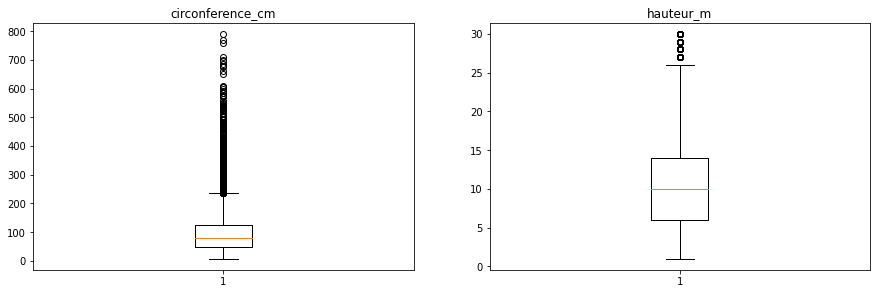

In [432]:
fig = plt.figure(figsize =(15, 10))

for i, v in enumerate(vars_quantitatives[:2]):
    ax = plt.subplot(2, 2, i+1)
    ax.boxplot(data_clean[v])
    plt.title(v)

plt.show()

Bien que des valeurs atypiques soient encore présentes, on note une répartition plus équilibrée des individus tant en circonference_cm qu'en hauteur_m, et la probable disparition d'un grand nombre de valeurs aberrantes.

# Imputation des valeurs manquantes <a class="anchor" id="P04_inputs"></a>
on peut utiliser des valeurs fixe, la médiane ou la moyenne, le mode, ou un autre stratégie intelligente.

In [433]:
data_input = data_clean.copy()

#### Regardons à nouveau les valeurs manquantes dans les differentes colonnes qui nous intéressent.

In [434]:
print_missing_counts(data_input, data_input.columns)

         domanialite is missing      1 values 	 -->     0.00%
      arrondissement is missing      0 values 	 -->     0.00%
                lieu is missing      0 values 	 -->     0.00%
    libelle_francais is missing   1349 values 	 -->     0.84%
               genre is missing      0 values 	 -->     0.00%
              espece is missing   1201 values 	 -->     0.75%
    circonference_cm is missing      0 values 	 -->     0.00%
           hauteur_m is missing      0 values 	 -->     0.00%
 stade_developpement is missing  29877 values 	 -->    18.70%
         remarquable is missing  32520 values 	 -->    20.35%
            latitude is missing      0 values 	 -->     0.00%
           longitude is missing      0 values 	 -->     0.00%
         lieu_split0 is missing      0 values 	 -->     0.00%


<AxesSubplot:>

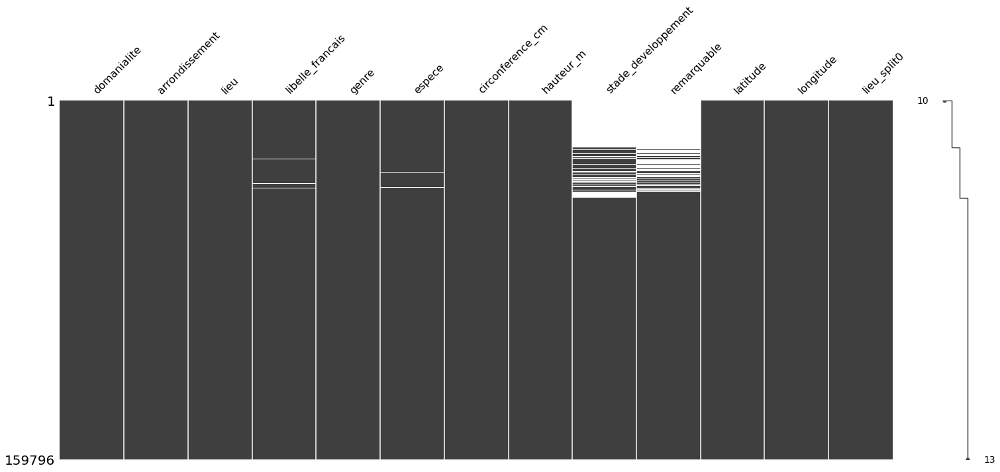

In [435]:
msno.matrix(data_input, sort='ascending')

---

## Imputation des colonnes `genre` et `libelle_francais` <a class="anchor" id="P04_input_genre_libelle"></a>

Regardons comment s'alignent les valeurs manquantes de ces colonnes.

<AxesSubplot:>

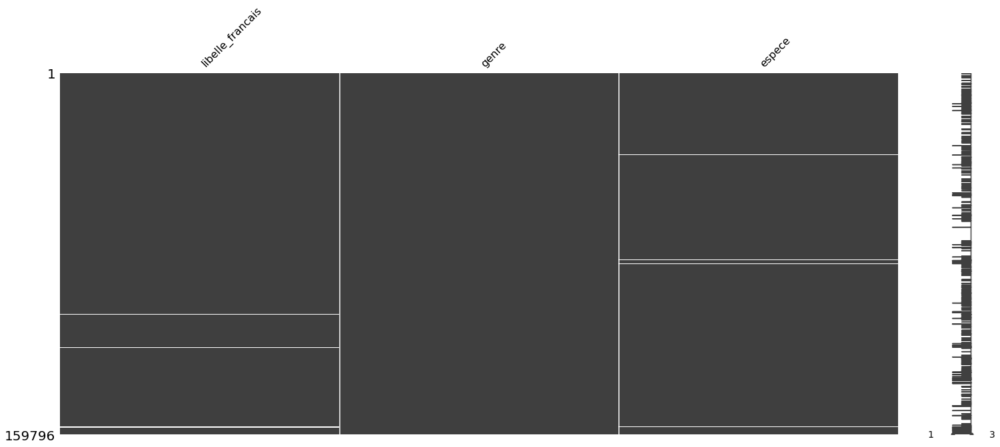

In [436]:
msno.matrix(data_input[['libelle_francais', 'genre', 'espece']])

In [437]:
print_missing_counts(data_input, ['libelle_francais', 'genre', 'espece'])

    libelle_francais is missing   1349 values 	 -->     0.84%
               genre is missing      0 values 	 -->     0.00%
              espece is missing   1201 values 	 -->     0.75%


Nous avons vu un peu plus haut qu'il serait intéressant d'imputer `libelle_francais` en s'appuyant sur `genre`, et d'imputer `espece` en s'appuyant sur `libelle_francais`.

#### Trouvons le `libelle_francais` le plus fréquent (mode) pour chaque `genre`.

In [438]:
genre_to_libelle = {}

base_select = data_clean[ data_clean.libelle_francais.notnull() ]

for genre in base_select['genre'].unique():
    select = base_select[ base_select.genre == genre ]
    mode = select['libelle_francais'].mode()
    genre_to_libelle[genre.strip()] = mode[0].strip()
    
# genre_to_libelle

#### Trouvons l'`espece` la plus fréquente (mode) pour chaque `libelle_francais` (avant son imputation).

In [439]:
libelle_to_espece = {}

base_select = data_clean[ (data_clean.espece.notnull()) & (data_clean.libelle_francais.notnull()) ]

for libelle in base_select['libelle_francais'].unique():
    select = base_select[ base_select.libelle_francais == libelle ]
    mode = select['espece'].mode()
    libelle_to_espece[libelle.strip()] = mode[0].strip()
    
# libelle_to_espece

#### A présent, nous allons attribuer à chaque lignes incomplète des colonnes espece ou label_francais du data_clean, les valeurs trouvées.

In [440]:
print(f"Nombre de valeurs manquantes AVANT inputation: {data_input['libelle_francais'].isnull().sum()}")
data_input['libelle_francais'].fillna( data_input['genre'].map(genre_to_libelle), inplace=True )
print(f"Nombre de valeurs manquantes APRES inputation: {data_input['libelle_francais'].isnull().sum()}")

Nombre de valeurs manquantes AVANT inputation: 1349
Nombre de valeurs manquantes APRES inputation: 0


In [441]:
print(f"Nombre de valeurs manquantes AVANT inputation: {data_input['espece'].isnull().sum()}")
data_input['espece'].fillna( data_input['libelle_francais'].map(libelle_to_espece), inplace=True )
print(f"Nombre de valeurs manquantes APRES inputation: {data_input['espece'].isnull().sum()}")

Nombre de valeurs manquantes AVANT inputation: 1201
Nombre de valeurs manquantes APRES inputation: 1


<AxesSubplot:>

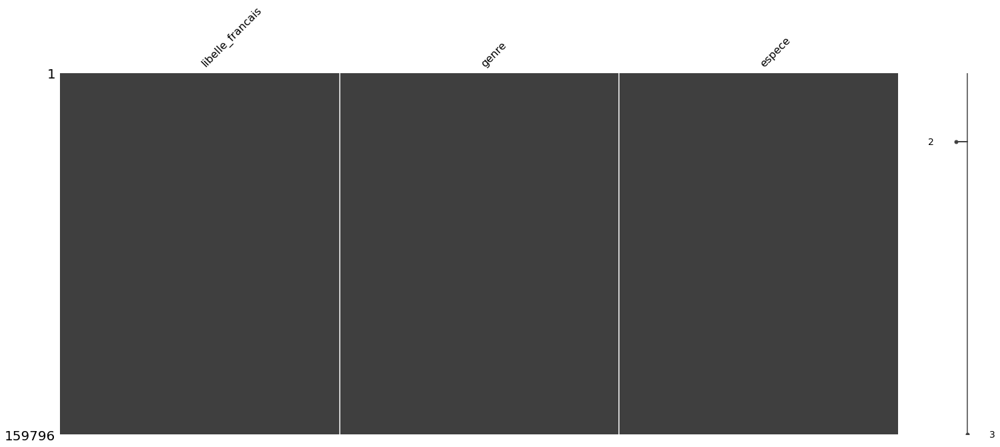

In [442]:
msno.matrix(data_input[['libelle_francais', 'genre', 'espece']])

In [443]:
print_missing_counts(data_input, ['libelle_francais', 'genre', 'espece'])

    libelle_francais is missing      0 values 	 -->     0.00%
               genre is missing      0 values 	 -->     0.00%
              espece is missing      1 values 	 -->     0.00%


In [444]:
data_input[data_input.espece.isnull() ]

,domanialite,arrondissement,lieu,libelle_francais,genre,espece,circonference_cm,hauteur_m,stade_developpement,remarquable,latitude,longitude,lieu_split0
53399,CIMETIERE,PARIS 18E ARRDT,CIMETIERE ST VINCENT / AVENUE LATERALE N2 / DI...,Genêt,Genista,NaN,10,1,NaN,0.00,48.89,2.34,CIMETIERE ST VINCENT


In [445]:
data_clean[data_clean.libelle_francais == "Genêt" ]

,domanialite,arrondissement,lieu,libelle_francais,genre,espece,circonference_cm,hauteur_m,stade_developpement,remarquable,latitude,longitude,lieu_split0
53399,CIMETIERE,PARIS 18E ARRDT,CIMETIERE ST VINCENT / AVENUE LATERALE N2 / DI...,Genêt,Genista,NaN,10,1,NaN,0.00,48.89,2.34,CIMETIERE ST VINCENT


C'est visiblement le seul représentant des `Genêts`... et donc il n'a pas été possible de l'imputer.

> Il faudra appliquer les changements en copiant le `data_input` sur `data_clean`

---

## Imputation de la colonne `remarquable` <a class="anchor" id="P04_input_remarquable"></a>

Regardons à nouveau le taux et la distribution des valeurs manquantes pour cette colonne.

In [446]:
print_missing_counts(data_input, ['remarquable'])

         remarquable is missing  32520 values 	 -->    20.35%


<AxesSubplot:>

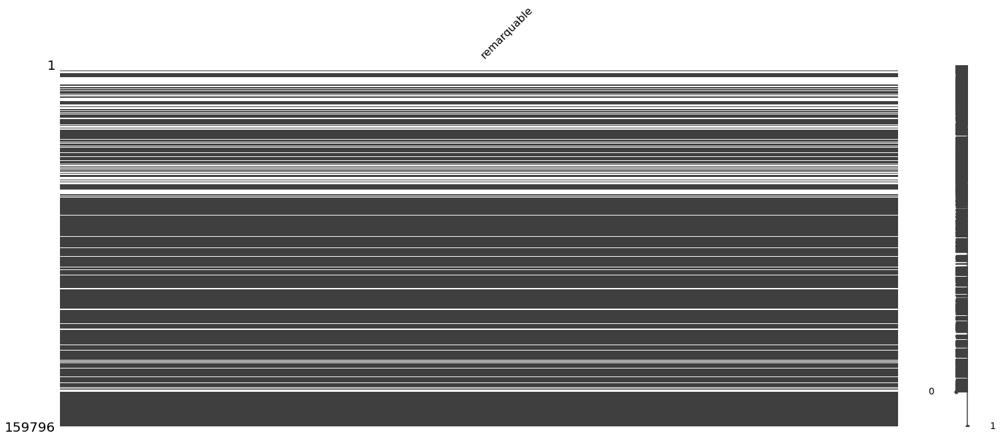

In [447]:
msno.matrix(data_input[['remarquable']])

Nous n'avons pas trouvé de colonne sur laquelle s'appuyer pour faire une imputation au plus proche du réel.

La solution la plus raisonnable semble être de marquer les arbres 'nan' comme **non** `remarquable` *(False)*, puisque l'énorme majorité des arbres qui disposent de cette information, sont justement non remarquable dans le dataset.

Nous allons en profiter pour remettre la colonne en type `boolean`.

#### Modifions les 1.0 par des True et les 0.0 par des False

In [448]:
data_input.remarquable = data_input.remarquable.map({0.0:False, 1.0:True})

In [449]:
data_input.remarquable.value_counts(dropna=False)

False    127104
NaN       32520
True        172
Name: remarquable, dtype: int64

#### Remplaçons les valeurs manquantes par des `False`
(la colonne va passer en boolean au même temps).

In [450]:
data_input.remarquable.fillna(False, inplace=True)

In [451]:
data_input.remarquable.value_counts(dropna=False)

False    159624
True        172
Name: remarquable, dtype: int64

In [452]:
data_input.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 159796 entries, 0 to 198878
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   domanialite          159795 non-null  object 
 1   arrondissement       159796 non-null  object 
 2   lieu                 159796 non-null  object 
 3   libelle_francais     159796 non-null  object 
 4   genre                159796 non-null  object 
 5   espece               159795 non-null  object 
 6   circonference_cm     159796 non-null  int64  
 7   hauteur_m            159796 non-null  int64  
 8   stade_developpement  129919 non-null  object 
 9   remarquable          159796 non-null  bool   
 10  latitude             159796 non-null  float64
 11  longitude            159796 non-null  float64
 12  lieu_split0          159796 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(8)
memory usage: 16.0+ MB


In [453]:
print_missing_counts(data_input, ['remarquable'])

         remarquable is missing      0 values 	 -->     0.00%


<AxesSubplot:>

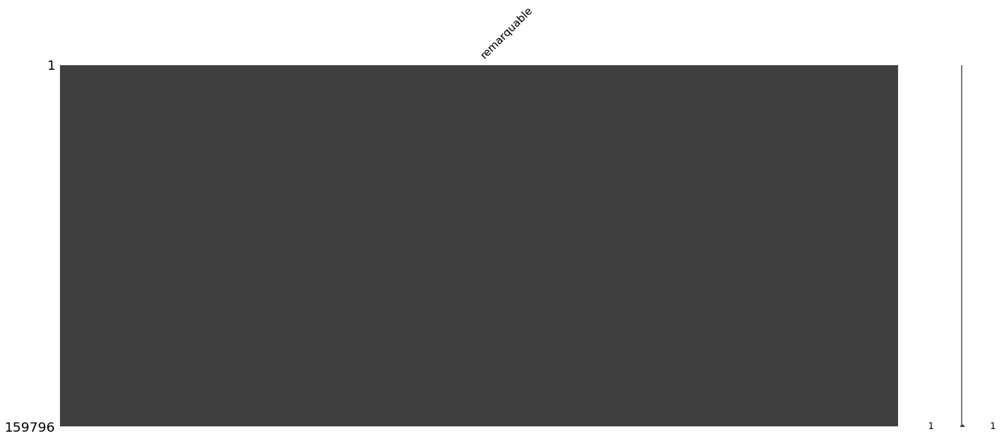

In [454]:
msno.matrix(data_input[['remarquable']])

---

## Imputation de la colonne `stade_developpement` <a class="anchor" id="P04_input_stade_developpement"></a>
Regardons à nouveau le taux et la distribution des valeurs manquantes pour cette colonne.

In [455]:
print_missing_counts(data_input, ['stade_developpement'])

 stade_developpement is missing  29877 values 	 -->    18.70%


<AxesSubplot:>

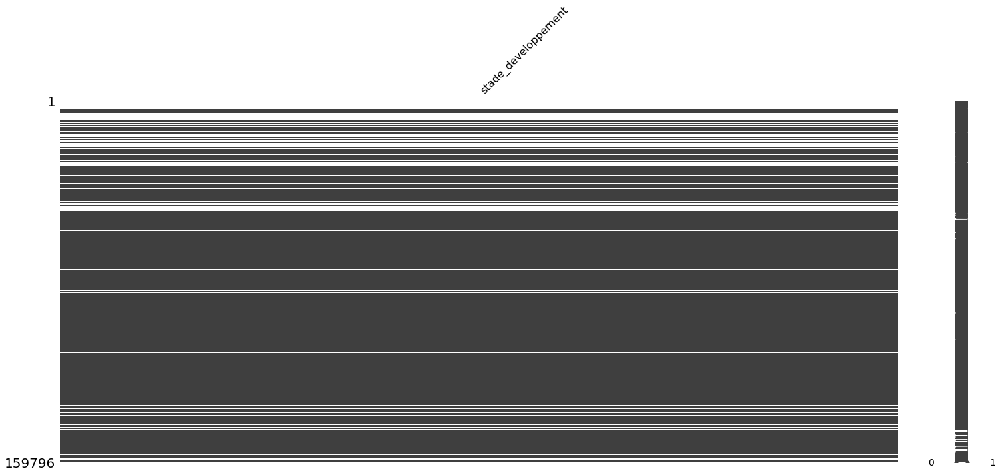

In [456]:
msno.matrix(data_input[['stade_developpement']])

> Comme nous l'avons vu plus haut, le `stade_developpement` est fortement lié aux valeurs de `circonference_cm` et `hauteur_cm`.
>
> Il parait donc raisonnable de s'appuyer sur ces valeurs pour imputer le `stede_developpement`.
> Mais les parametres de taille doivent aussi dépendre de l'`espece`, du `genre` ou du `libelle_francais`. Donc on peut éventuellement s'appuyer dessus également.

> La solution la plus logique avec toutes ces colonnes est certainement de déduire le `stade_developpement` à l'aide d'une classification.

### Entrainons un classifier pour imputer les `stade_developpement` manquants.

In [457]:
data_clf = data_input.copy()

Préparons une copie du jeu de donnée ne contenant que les colonnes qui nous intéressent.

In [458]:
data_clf = data_clf[['genre','espece','libelle_francais','circonference_cm','hauteur_m', 'stade_developpement']]

<AxesSubplot:>

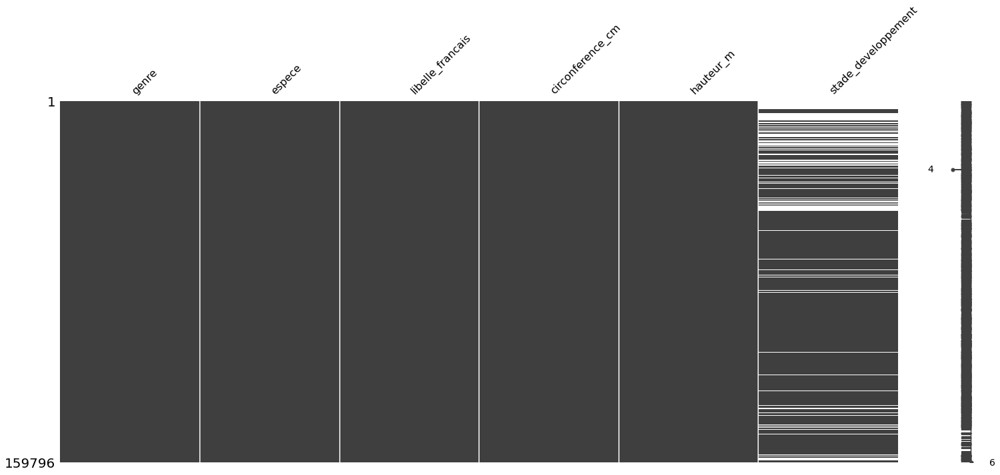

In [459]:
msno.matrix(data_clf)

#### Encodons les colonnes avec des valeurs nominales

In [460]:
from sklearn.preprocessing import LabelEncoder

In [461]:
for col in ['genre','espece', 'libelle_francais','stade_developpement']:
    le = LabelEncoder()
    data_clf[col] = le.fit_transform(data_clf[col])

In [462]:
data_clf.head(3)

,genre,espece,libelle_francais,circonference_cm,hauteur_m,stade_developpement
0,5,125,91,20,5,4
1,129,31,77,65,8,0
2,129,31,77,90,10,0


#### Séparons les lignes qui doivent être imputées des lignes qui vont servir à entrainer/valider/tester le classifier

In [463]:
data_clf.stade_developpement.unique()

array([4, 0, 1, 3, 2])

In [464]:
# Un dataset avec toutes les lignes dont on connait le stade_developpement
data_clf_known = data_clf[ data_clf.stade_developpement != 4 ]

# Un dataset avec toutes les lignes dont on ne connais PAS le stade_developpement
data_clf_unknown = data_clf[ data_clf.stade_developpement == 4 ]

#### Préparons des jeux d'entrainement, de validation et de test

In [465]:
from sklearn.model_selection import train_test_split

In [466]:
X_train_full, X_test, y_train_full, y_test = train_test_split(
                                                data_clf_known[['genre', 'libelle_francais', 'espece','circonference_cm','hauteur_m']], 
                                                data_clf_known['stade_developpement'], 
                                                test_size=0.20,
                                                random_state=0)

In [467]:
X_train, X_valid, y_train, y_valid = train_test_split(X_train_full, y_train_full, test_size=X_test.shape[0], random_state=0)

In [468]:
X_train.shape, y_train.shape, X_valid.shape, y_valid.shape, X_test.shape, y_test.shape

((77951, 5), (77951,), (25984, 5), (25984,), (25984, 5), (25984,))

### Entrainons un classifieur <a class="anchor" id="P04_input_stade_developpement_classifiers"></a>

#### Etablissons une baseline

In [469]:
from sklearn.metrics import accuracy_score
from sklearn.dummy import DummyClassifier

In [470]:
model = DummyClassifier(random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy_score(y_test, y_pred)

0.49422721674876846

#### Entrainons un KNN (k-nearest neighbors)

In [471]:
from sklearn.neighbors import KNeighborsClassifier

In [472]:
model_knn = KNeighborsClassifier()

In [473]:
model_knn.fit(X_train, y_train)

KNeighborsClassifier()

In [474]:
y_pred_knn = model_knn.predict(X_test)

In [475]:
accuracy_score(y_test, y_pred_knn)

0.7258697660098522

> On voir qu'avec un KNN de base (sans toucher aux paramètres), on obtient une `accuracy` nettement supérieure à celle du Dummy Classifier; ce modèle apprend quelque chose à partie des données.

Utilisons à présent une recherche en grille avec cross-validation pour voir si l'on peut encore améliorer le score en ajoutant le paramètre du nombre de voisins à prendre en compte.

In [476]:
param_grid = {
    'n_neighbors': list(range(1,35,2)) # tous les chiffres impairs de 1 à 33 inclus
}

In [477]:
model_knn_grid = KNeighborsClassifier()

In [478]:
from sklearn.model_selection import GridSearchCV

knn_grid_clf = GridSearchCV(model_knn_grid, param_grid, cv=10, n_jobs=-1)
knn_grid_clf.fit(X_train_full, y_train_full)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21,
                                         23, 25, 27, 29, 31, 33]})

In [479]:
knn_grid_clf.best_estimator_

KNeighborsClassifier(n_neighbors=19)

In [480]:
y_pred_knn_grid = knn_grid_clf.predict(X_test)

In [481]:
accuracy_score(y_test, y_pred_knn_grid)

0.7413408251231527

> En effet, si l'on utilise un réglage avec les 19 plus proches voisins, on obtient un score légèrement plus haut de 0.74 contre 0.73.

Regardons un peu la répartition des valeurs

In [482]:
pd.DataFrame([
    pd.Series(y_test).value_counts(), 
    pd.Series(y_pred_knn_grid).value_counts()], 
    index=['y_test','y_pred']).T

,y_test,y_pred
0,12842,13507
2,6799,6248
1,5164,5303
3,1179,926


> Avec une **accuracy de 74%**, on est loin du sans faute, mais on est visiblement dans des proportions raisonnables.<br>
Il faudrait faire un resampling du dataset pour avoir un apport équivalent de chacune des 4 classes.

On peut aussi essayer avec un autre modèle comme par exemple un RandomForestClassifier.

#### Entrainons un RandomForestClassifier

In [483]:
from sklearn.ensemble import RandomForestClassifier

In [484]:
model_rfc = RandomForestClassifier()

In [485]:
model_rfc.fit(X_train, y_train)

RandomForestClassifier()

In [486]:
y_pred_rfc = model_rfc.predict(X_test)

In [487]:
accuracy_score(y_test, y_pred_rfc)

0.7508851600985221

> On constate avec ce RandomForest de base, une accuracy sensiblement égale à celle du KNN avec réglages.

Voyons à présent si l'on peut obtenir un meilleur résultat en ajustant quelques paramètres.

In [ ]:
param_grid = {
    'n_estimators': [100, 125, 150],
    'max_depth': [None, 1, 3, 5, 7, 9],
    'max_features': [1,2,3, 'auto', 'sqrt', 'log2']
}

#param_grid = {
#    'n_estimators': [100, 120, 150],
#    'criterion': ['entropy', 'gini'], 
#    'max_depth': [None,1,3,5,7,9],
#    'max_features': range(1,11),  
#    'min_samples_split': range(2, 10),
#    'min_samples_leaf': [1,3,5]
#}

In [ ]:
model_rfc_grid = RandomForestClassifier()

In [ ]:
from sklearn.model_selection import GridSearchCV

rfc_grid_clf = GridSearchCV(model_rfc_grid, param_grid, cv=10, n_jobs=-1)
rfc_grid_clf.fit(X_train_full, y_train_full)

In [ ]:
rfc_grid_clf.best_estimator_

In [ ]:
y_pred_rfc_grid = rfc_grid_clf.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred_rfc_grid)

> On obtient un score d'accuracy légèrement supérieur à ce que nous avions déjà obtenu. Mais les scores sont très proches, et la distribution des données d'entrainement, validation ou test pourraient très bien inverser des scores si proches...

> Dans ces conditions, autant rester sur un modèle simple.

### Imputation à partir du modèle RandomForest

#### On estime le `stade_developpement` le plus probable pour chaque ligne où il est inconnu

In [488]:
y_pred_input = model_rfc.predict(data_clf_unknown[['genre', 'libelle_francais', 'espece','circonference_cm','hauteur_m']])

In [489]:
y_pred_input

array([1, 3, 1, ..., 1, 1, 1])

#### On remet les valeurs initiales *(J, JA, A, M à la place de 0,1,2,3)*

In [490]:
new_stade_developpement = le.inverse_transform(y_pred_input)

#### On copie les nouvelles valeurs dans le jeu de donné `data_input`

In [491]:
data_input.loc[ data_input.stade_developpement.isnull(), "stade_developpement"] = new_stade_developpement

#### Affichons à nouveau le taux et le graphique pour les valeurs manquantes

In [492]:
print_missing_counts(data_input, ['stade_developpement'])

 stade_developpement is missing      0 values 	 -->     0.00%


<AxesSubplot:>

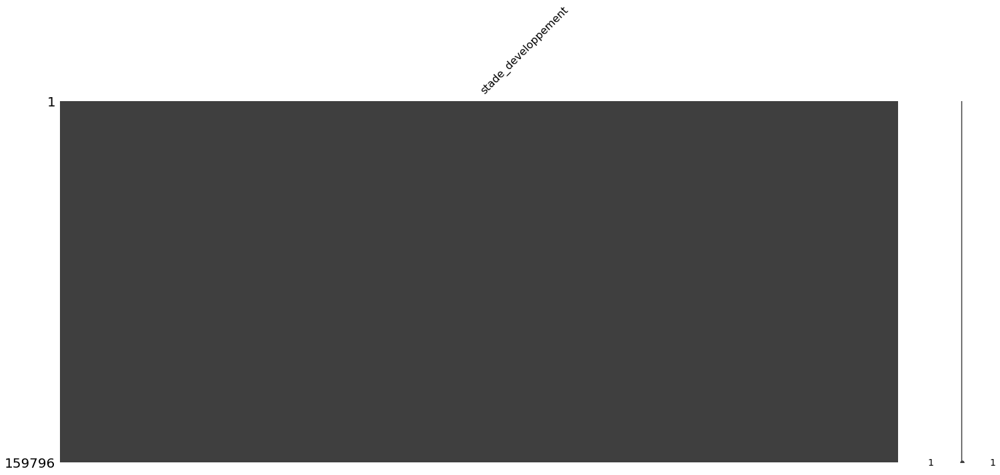

In [493]:
msno.matrix(data_input[['stade_developpement']])

#### Enfin, affichons la distribution avant et après l'imputation

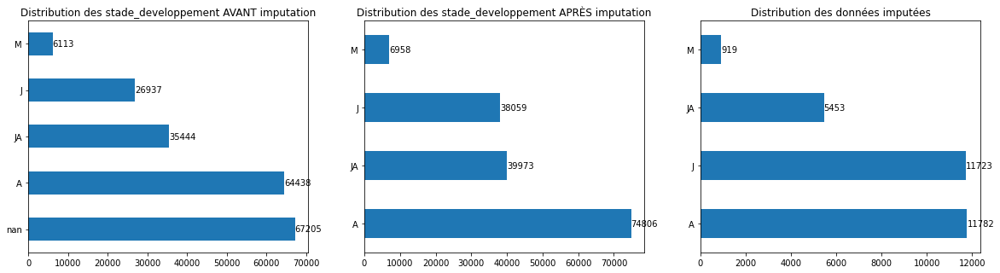

In [494]:
figure = plt.figure(figsize=(20,5))

plt.subplot(1,3,1)
select = data.stade_developpement.value_counts(dropna=False)
ax = select.plot(kind='barh', title="Distribution des stade_developpement AVANT imputation")
for container in ax.containers:
    ax.bar_label(container)
    

plt.subplot(1,3,2)
select = data_input.stade_developpement.value_counts(dropna=False)
ax = select.plot(kind='barh', title="Distribution des stade_developpement APRÈS imputation")
for container in ax.containers:
    ax.bar_label(container)

plt.subplot(1,3,3)
select = pd.Series(new_stade_developpement).value_counts(dropna=False)
ax = select.plot(kind='barh', title="Distribution des données imputées")
for container in ax.containers:
    ax.bar_label(container)
    
plt.show()

> L'imputation à visiblement été très bénéfique pour les `Jeunes` et `Jeunes Adultes`.

### Regardons à nouveau les valeurs manquantes dans les differentes colonnes qui nous intéressent.

In [495]:
print_missing_counts(data_input, data_input.columns)

         domanialite is missing      1 values 	 -->     0.00%
      arrondissement is missing      0 values 	 -->     0.00%
                lieu is missing      0 values 	 -->     0.00%
    libelle_francais is missing      0 values 	 -->     0.00%
               genre is missing      0 values 	 -->     0.00%
              espece is missing      1 values 	 -->     0.00%
    circonference_cm is missing      0 values 	 -->     0.00%
           hauteur_m is missing      0 values 	 -->     0.00%
 stade_developpement is missing      0 values 	 -->     0.00%
         remarquable is missing      0 values 	 -->     0.00%
            latitude is missing      0 values 	 -->     0.00%
           longitude is missing      0 values 	 -->     0.00%
         lieu_split0 is missing      0 values 	 -->     0.00%


<AxesSubplot:>

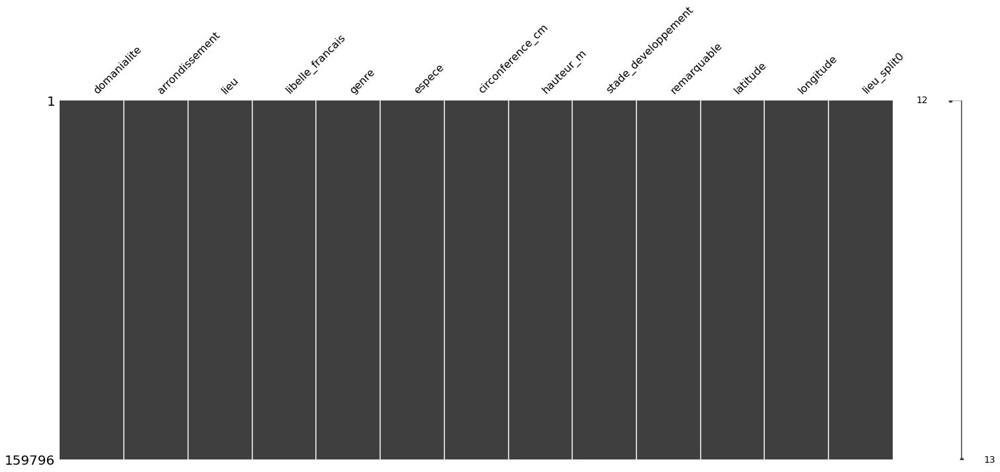

In [496]:
msno.matrix(data_input, sort='ascending')

#### Nous pouvons donc appliquer les imputations au jeu de donnée de reference (data_clean)

In [497]:
data_clean = data_input.copy()

## Détection et suppression des doublons <a class="anchor" id="P04_clean_duplicate"></a>

#### Commençons par vérifier si il y avait des doublons sur le jeu de données de base, pour les colonnes que nous avons gardé.

In [498]:
data[[*data_clean.columns[:-3], 'geo_point_2d_a', 'geo_point_2d_b']].duplicated().sum()

2

Il y a donc deux lignes qui sont l'exacte copie d'autres lignes.

#### Vérifions si elles sont toujours en doublon dans le jeu de données nettoyé.

In [499]:
data_clean[[*data_clean.columns[:-1]]].duplicated().sum() # je ne prend pas en compte la colonne lieu_split0

0

> Il n'y a visiblement aucun doublon dans le dataset nettoyé.

Il se peut que les lignes en question aient été des lignes pour des arbres plantés au même endroit (un ancien arbre abbatu, et un nouvel arbre planté à la place...), et qui du coup ont été différenciés par l'imputation du `stade_developpement` ou un autre critère imputé.

### Regardons si certains arbres ont le même emplacement...
A priori deux arbres ne peuvent pas avoir le même emplacement... donc si il y en a, il faudra nettoyer.

In [500]:
data_clean[['latitude','longitude']].duplicated().sum()

4

#### Affichons d'abord les lignes considerées comme "originales"

In [501]:
data_clean[ data_clean[['latitude','longitude']].duplicated(keep='first') ]

,domanialite,arrondissement,lieu,libelle_francais,genre,espece,circonference_cm,hauteur_m,stade_developpement,remarquable,latitude,longitude,lieu_split0
76385,PERIPHERIQUE,PARIS 19E ARRDT,VOIE DF/19,Peuplier,Populus,nigra,120,20,A,False,48.90,2.39,VOIE DF
76386,PERIPHERIQUE,PARIS 19E ARRDT,VOIE DF/19,Peuplier,Populus,nigra,100,20,A,False,48.90,2.39,VOIE DF
76387,PERIPHERIQUE,PARIS 19E ARRDT,VOIE DF/19,Peuplier,Populus,nigra,165,20,A,False,48.90,2.39,VOIE DF
188304,Jardin,BOIS DE VINCENNES,PARC FLORAL DE PARIS / ROUTE DE LA PYRAMIDE,Platane,Platanus,x hispanica,190,24,A,False,48.84,2.44,PARC FLORAL DE PARIS


#### Puis affichons les lignes considées comme doublons.

In [502]:
data_clean[ data_clean[['latitude','longitude']].duplicated(keep='last') ]

,domanialite,arrondissement,lieu,libelle_francais,genre,espece,circonference_cm,hauteur_m,stade_developpement,remarquable,latitude,longitude,lieu_split0
12794,Jardin,PARIS 19E ARRDT,VOIE DF19,Peuplier,Populus,nigra,120,20,A,False,48.90,2.39,VOIE DF19
12795,Jardin,PARIS 19E ARRDT,VOIE DF19,Peuplier,Populus,nigra,100,20,A,False,48.90,2.39,VOIE DF19
12796,Jardin,PARIS 19E ARRDT,VOIE DF19,Peuplier,Populus,nigra,165,20,A,False,48.90,2.39,VOIE DF19
188269,Jardin,BOIS DE VINCENNES,PARC FLORAL DE PARIS / ROUTE DE LA PYRAMIDE,Platane,Platanus,x hispanica,195,18,A,False,48.84,2.44,PARC FLORAL DE PARIS


On constate que l'on a en fait 2 arbres qui posent problème.
- L'un d'entre eux à 6 lignes qui le représentent à 3 hauteurs différentes, pour 2 domanialité différentes.
- Le second à 2 lignes dont la seule distinction est la hauteur qui passe de 190 à 195 cm.

#### Nettoyons donc ces quelques lignes en surplus

In [503]:
data_duplicate = data_clean.copy()

In [504]:
data_duplicate.drop([76385, 76386, 76387, 12794, 12795, 188304], axis='index', inplace=True)

In [505]:
data_duplicate[['latitude','longitude']].duplicated().sum()

0

#### Nous pouvons à présent appliquer les modifications au jeu de donnée de reference (data_clean)

In [506]:
data_clean = data_duplicate.copy()

# 5. Synthèse de l'analyse de données<a class="anchor" id="P05"></a>

Nous avons appris à comprendre le jeu de données et explorant chacune de ses colonnes individuellement, puis en recoupant plusieurs d'entre elles selon des critères choisis pour servir notre objectif principal; **optimiser les tournées pour l’entretien des arbres de la ville**.

Puis nous avons nettoyé et imputé ce jeu de donnée pour maximiser son utilité et la pertinence des solutions apportées.

#### Il y a de nombreuses façons d'utiliser ce jeu de donnée nettoyé pour optimiser les tournées... Voyons quelques exemples.

## Tournées d'arrosage
On a noté qu'une fois planté, un arbre reçoit des soins pendant 3 ans pour garantir une bonne reprise et un développement harmonieux : il est arrosé régulièrement (environ 100 litres d’eau tous les 15 jours de mars à septembre). Après ces 3 premières années, l’arbre en pleine croissance (sauf exception) ne nécessite plus de soin particulier.

#### Affichons les jeunes arbres (`stade_developpement` = Jeune) arrondissement par arrondissement.

In [587]:
select = data_clean[ (data_clean.stade_developpement == 'J')]

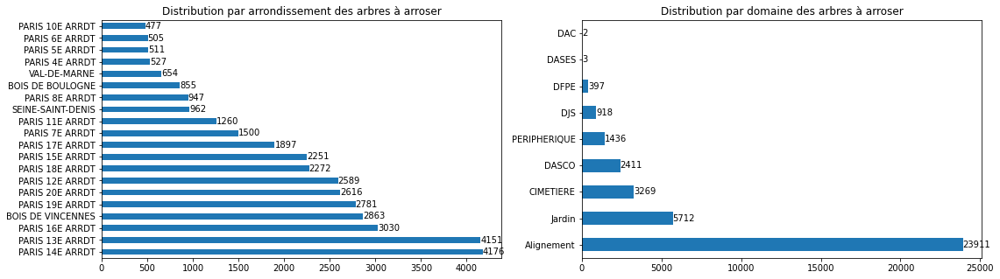

In [591]:
figure = plt.figure(figsize=(18,5))

plt.subplot(1,2,1)
select_count = select.arrondissement.value_counts()
ax = select_count[:20].plot(kind='barh', title="Distribution par arrondissement des arbres à arroser")

for container in ax.containers:
    ax.bar_label(container)
    
plt.subplot(1,2,2)
select_count = select.domanialite.value_counts()
ax = select_count[:20].plot(kind='barh', title="Distribution par domaine des arbres à arroser")

for container in ax.containers:
    ax.bar_label(container)

plt.show()

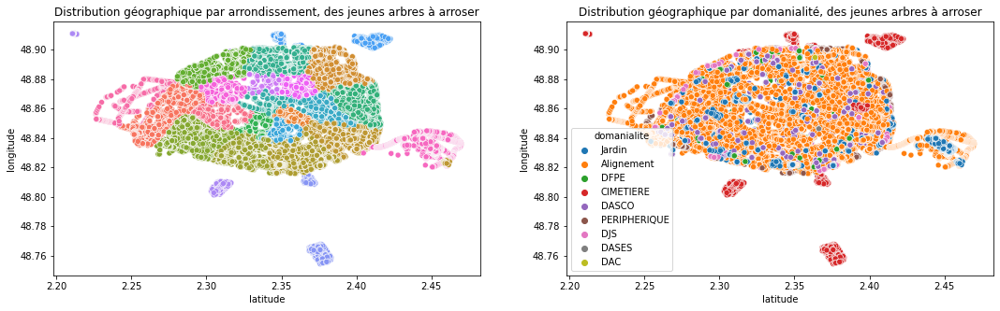

In [593]:
figure = plt.figure(figsize=(18,5))

plt.subplot(1,2,1)
ax = sns.scatterplot(data=select,x="longitude",y="latitude", hue='arrondissement')
ax.set_title(f'Distribution géographique par arrondissement, des jeunes arbres à arroser')
plt.xlabel("latitude")
plt.ylabel("longitude")
plt.legend([],[], frameon=False)

plt.subplot(1,2,2)
ax = sns.scatterplot(data=select,x="longitude",y="latitude", hue='domanialite')
ax.set_title(f'Distribution géographique par domanialité, des jeunes arbres à arroser')
plt.xlabel("latitude")
plt.ylabel("longitude")

plt.show()

In [594]:
# Ici on instantie Folium avec des coordonnées de départ (La mairie de Paris) et un zoom raisonnable
m = folium.Map(location=["48.856614", "2.3522219"], zoom_start=12)

# Puis on ajoute chacun des points d'intéret sur notre map (dans ce cas, les arbres remarquables)
for arrondissement in sorted(data_clean.arrondissement.unique(), reverse=True):
    show = arrondissement in ["PARIS 1ER ARRDT", "PARIS 2E ARRDT", "PARIS 3E ARRDT", "PARIS 4E ARRDT"]
    feature_group = folium.FeatureGroup(arrondissement, show=show)
    arrondissement_select = select[ select.arrondissement == arrondissement ]
    
    feature_group.add_child(FastMarkerCluster(
    arrondissement_select[["latitude", "longitude",
                    "genre", "espece", "libelle_francais", 
                    "circonference_cm", "hauteur_m", 
                    "stade_developpement", "remarquable"]].values.tolist(), 
            showCoverageOnHover = True,
            spiderfyOnMaxZoom = False,
            disableClusteringAtZoom = 15,
            callback = callback ))

    feature_group.add_to(m)
    
folium.LayerControl().add_to(m)
    
# Et on l'affiche
m

Evidemment, ça fait encore beaucoup d'arbres... Mais à présent que le jeu de donnée est propre, on peut croiser beaucoup de données pour avoir quelque chose de plus précis.

Par exemple, on pourrait s'occuper de l'arrosage de ces arbres en ajoutant le domaine en plus de l'arrondissement.

Par ailleurs, ajouter une colonne indiquant la `date_arrosage` ou de `dernier_passage`, serait un serieux avantage pour planifier les trajets.

In [595]:
m = folium.Map(location=["48.856614", "2.3522219"], zoom_start=12)

for domaine in data_clean.domanialite.unique():
    if str(domaine) == 'nan':
        continue
    show = domaine in ["Alignement"]
    feature_group = folium.FeatureGroup(domaine, show=show)
    domaine_select = select[ select.domanialite == domaine ]
    
    feature_group.add_child(FastMarkerCluster(
    domaine_select[["latitude", "longitude",
                    "genre", "espece", "libelle_francais", 
                    "circonference_cm", "hauteur_m", 
                    "stade_developpement", "remarquable"]].values.tolist(), 
            showCoverageOnHover = True,
            spiderfyOnMaxZoom = True,
            disableClusteringAtZoom = 15,
            callback = callback ))

    feature_group.add_to(m)
    
folium.LayerControl().add_to(m)
m

## Suivi et diagnostic

### Les mesures manquantes ou à refaire

Si l'on a supprimé de nombreuses lignes pour lesquels les valeurs semblaient abérrantes, il ne faut pas oublier les arbres pour autant.

On peut donc organiser des tournées pour reprendre les mesure des arbres qui ont été isolés du jeu de donnée pour le moment.

In [597]:
data_outliers = pd.concat([data_outliers_circonference_cm, data_outliers_hauteur_m])
print(f"Il y a {data_outliers.shape[0]} arbres pour lesquels les données de hauteur ou de circonférence semblent anormales")

Il y a 40341 arbres pour lesquels les données de hauteur ou de circonférence semblent anormales


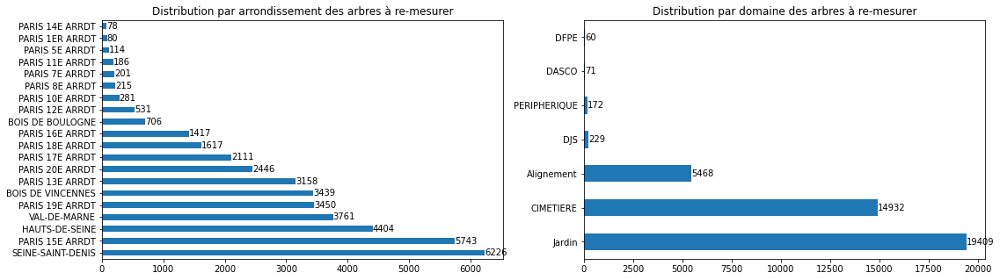

In [598]:
figure = plt.figure(figsize=(18,5))

plt.subplot(1,2,1)
select_count = data_outliers.arrondissement.value_counts()
ax = select_count[:20].plot(kind='barh', title="Distribution par arrondissement des arbres à re-mesurer")

for container in ax.containers:
    ax.bar_label(container)
    
plt.subplot(1,2,2)
select_count = data_outliers.domanialite.value_counts()
ax = select_count[:20].plot(kind='barh', title="Distribution par domaine des arbres à re-mesurer")

for container in ax.containers:
    ax.bar_label(container)

plt.show()

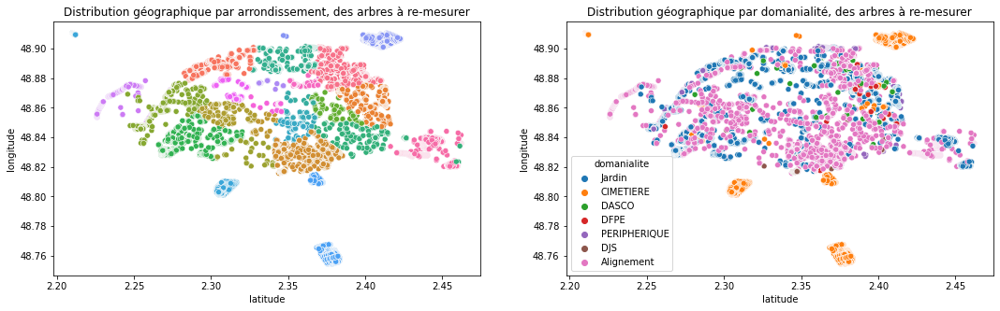

In [600]:
figure = plt.figure(figsize=(18,5))

plt.subplot(1,2,1)
ax = sns.scatterplot(data=data_outliers,x="longitude",y="latitude", hue='arrondissement')
ax.set_title(f'Distribution géographique par arrondissement, des arbres à re-mesurer')
plt.xlabel("latitude")
plt.ylabel("longitude")
plt.legend([],[], frameon=False)

plt.subplot(1,2,2)
ax = sns.scatterplot(data=data_outliers,x="longitude",y="latitude", hue='domanialite')
ax.set_title(f'Distribution géographique par domanialité, des arbres à re-mesurer')
plt.xlabel("latitude")
plt.ylabel("longitude")

plt.show()

In [567]:
m = folium.Map(location=["48.856614", "2.3522219"], zoom_start=12)

select = data_outliers

for arrondissement in sorted(data_clean.arrondissement.unique(), reverse=True):
    # show = arrondissement in ["PARIS 1ER ARRDT", "PARIS 2E ARRDT", "PARIS 3E ARRDT", "PARIS 4E ARRDT", "SEINE-SAINT-DENIS"]
    feature_group = folium.FeatureGroup(arrondissement, show=True)
    arrondissement_select = select[ select.arrondissement == arrondissement ]
    
    feature_group.add_child(FastMarkerCluster(
    arrondissement_select[["latitude", "longitude",
                    "genre", "espece", "libelle_francais", 
                    "circonference_cm", "hauteur_m", 
                    "stade_developpement", "remarquable"]].values.tolist(), 
            showCoverageOnHover = True,
            spiderfyOnMaxZoom = False,
            disableClusteringAtZoom = 15,
            callback = callback ))

    feature_group.add_to(m)
    
folium.LayerControl(collapsed=True).add_to(m)
m


### Les arbres qu'il faudrait contrôler en raison de leur hauteur importante

In [602]:
# select = data_clean[ data_clean.hauteur_m > data_clean.hauteur_m.quantile(0.95) ]
select = data_clean[ data_clean.hauteur_m > 20 ]
select.shape

(4594, 13)

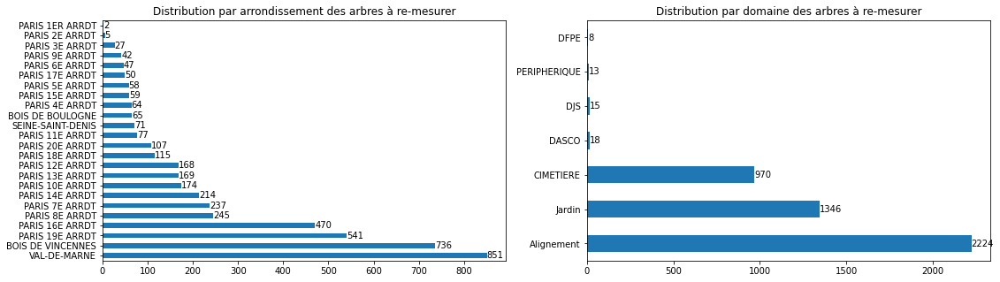

In [603]:
figure = plt.figure(figsize=(18,5))

plt.subplot(1,2,1)
select_count = select.arrondissement.value_counts()
ax = select_count.plot(kind='barh', title="Distribution par arrondissement des arbres à re-mesurer")

for container in ax.containers:
    ax.bar_label(container)
    
plt.subplot(1,2,2)
select_count = select.domanialite.value_counts()
ax = select_count.plot(kind='barh', title="Distribution par domaine des arbres à re-mesurer")

for container in ax.containers:
    ax.bar_label(container)

plt.show()

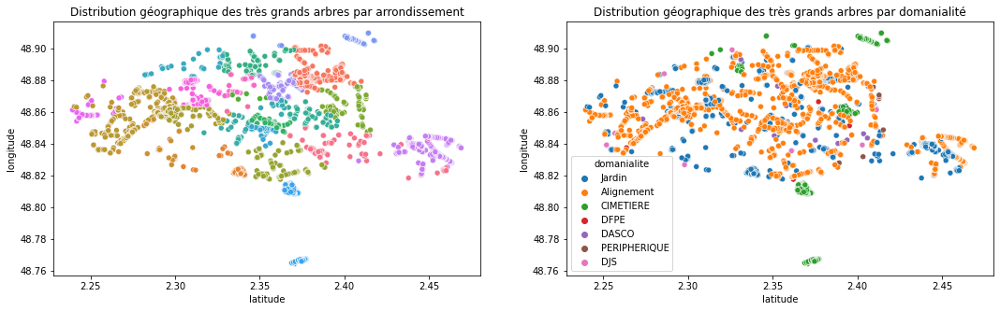

In [604]:
figure = plt.figure(figsize=(18,5))

plt.subplot(1,2,1)
ax = sns.scatterplot(data=select,x="longitude",y="latitude", hue='arrondissement')
ax.set_title(f'Distribution géographique des très grands arbres par arrondissement')
plt.xlabel("latitude")
plt.ylabel("longitude")
plt.legend([],[], frameon=False)

plt.subplot(1,2,2)
ax = sns.scatterplot(data=select,x="longitude",y="latitude", hue='domanialite')
ax.set_title(f'Distribution géographique des très grands arbres par domanialité')
plt.xlabel("latitude")
plt.ylabel("longitude")

plt.show()

In [557]:
# Ici on instantie Folium avec des coordonnées de départ (La mairie de Paris) et un zoom raisonnable
m = folium.Map(location=["48.856614", "2.3522219"], zoom_start=12)

# Puis on ajoute chacun des points d'intéret sur notre map (dans ce cas, les arbres remarquables)
for arrondissement in sorted(data_clean.arrondissement.unique(), reverse=True):
    feature_group = folium.FeatureGroup(arrondissement, show=True)
    arrondissement_select = select[ select.arrondissement == arrondissement ]
    
    feature_group.add_child(FastMarkerCluster(
    arrondissement_select[["latitude", "longitude",
                    "genre", "espece", "libelle_francais", 
                    "circonference_cm", "hauteur_m", 
                    "stade_developpement", "remarquable"]].values.tolist(), 
            showCoverageOnHover = True,
            spiderfyOnMaxZoom = False,
            disableClusteringAtZoom = 15,
            callback = callback ))

    feature_group.add_to(m)
    
folium.LayerControl(collapsed=True).add_to(m)
    
# Et on l'affiche
m

## Plantage : diversité des espece / genre 

In [648]:
top_size = 20
split_value = data_clean.libelle_francais.value_counts()[top_size-2]
split_value

select_count = data_clean.libelle_francais.value_counts()
select_top = select_count.keys()[ select_count >= split_value ]
select_others = select_count.keys()[ select_count < split_value ]

select_top

Index(['Platane', 'Marronnier', 'Tilleul', 'Erable', 'Sophora', 'Frêne',
       'Micocoulier', 'Peuplier', 'Noisetier de Byzance', 'Chêne', 'Pin',
       'Poirier à fleurs', 'Charme', 'Cerisier à fleurs', 'Robinier', 'Orme',
       'If', 'Bouleau', 'Paulownia'],
      dtype='object')

In [619]:
select = data_clean.libelle_francais.value_counts()
top_size = 19
select_top = select[:top_size]
select_bottom = select[top_size:]
select = pd.DataFrame([*select_top, select_bottom.sum()], index=[*select_top.index, "others"])
select

,0
Platane,39195
Marronnier,22886
Tilleul,17642
Erable,12503
Sophora,10442
Frêne,3490
Micocoulier,3340
Peuplier,2872
Noisetier de Byzance,2763
Chêne,2743


In [621]:
figure = plt.figure(figsize=(10,5))

#select_count = data_clean.libelle_francais.value_counts()
select_count = select.libelle_francais.value_counts()
ax = select_count[:20].plot(kind='barh', title="Distribution des arbres par espece")

for container in ax.containers:
    ax.bar_label(container)

plt.show()

AttributeError: 'DataFrame' object has no attribute 'libelle_francais'

<Figure size 720x360 with 0 Axes>

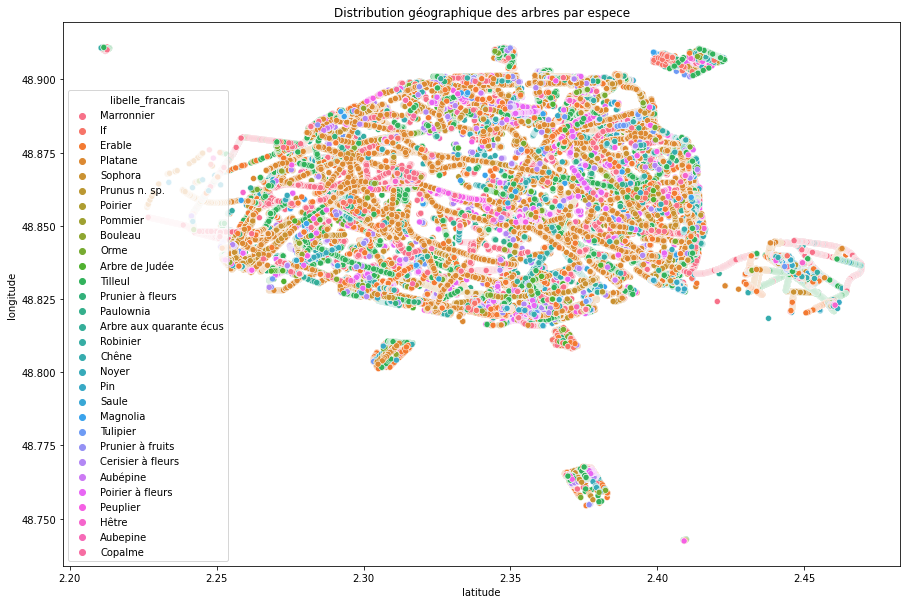

In [606]:
figure = plt.figure(figsize=(15,10))

select = data_clean[ data_clean.libelle_francais.isin(data_clean.libelle_francais.unique()[:30]) ]

ax = sns.scatterplot(data=select,x="longitude",y="latitude", hue='libelle_francais')
ax.set_title(f'Distribution géographique des arbres par espece')
plt.xlabel("latitude")
plt.ylabel("longitude")

plt.show()

In [ ]:
m = folium.Map(location=["48.856614", "2.3522219"], zoom_start=12)

for arrondissement in sorted(data_clean.arrondissement.unique(), reverse=True):
    show = arrondissement in ["PARIS 1ER ARRDT", "PARIS 2E ARRDT", "PARIS 3E ARRDT", "PARIS 4E ARRDT"]
    feature_group = folium.FeatureGroup(arrondissement, show=show)
    arrondissement_select = select[ select.arrondissement == arrondissement ][:20]
    
    feature_group.add_child(FastMarkerCluster(
    arrondissement_select[["latitude", "longitude",
                    "genre", "espece", "libelle_francais", 
                    "circonference_cm", "hauteur_m", 
                    "stade_developpement", "remarquable"]].values.tolist(), 
            showCoverageOnHover = True,
            spiderfyOnMaxZoom = False,
            disableClusteringAtZoom = 15,
            callback = callback ))

    feature_group.add_to(m)
    
folium.LayerControl().add_to(m)
m

In [601]:
## Colonnes utiles

### Dernier controle ?
### Dernier arrosage ?
### Près d'un batiment ?

In [ ]:
# Arrosage >> moins de 3 ans >> Jeune
# Diagnostic >> tous >> secteur par secteur ?
# Taille de formation >> Jeune et Jeune Arbres
# Taille architecturée >> Domanialite:Alignement
# Taille de réduction >> Domanialite:DJS, DFPE, DASCO, DAC, DASES (peut être des bureaux ?)
# Taille raisonnée >> ceux qui ne sont pas taillés autrement
# Abattage anticipé >> il faudrait l'age en plus de l'espèce >> on peut la déduire avec la formule
# Abattage non-anticipé >> il faudrait savoir lesquels (donc un indicateur de controle)
# Plantage >> on peut essayer de trouver les secteurs qui manquent de densité 
# Replantage de diversification >> on peut essayer de trouver les secteurs qui manque de diversité
# Replantage d'espece local >> on peut essayer de vérifier la densité d'espèce local (lesquelles ?)

# Les outils tailles dépendent de la hauteur des arbres je pense

In [ ]:
# Il faudrait ajouter de nouvelles colonnes à la DB
## les dates (controle externe, controle interne, élagage, arrosage, ...)
## 

In [ ]:
import os

In [ ]:
os.path

In [ ]:
import folium

In [ ]:
m = folium.Map(location=["48.856614", "2.3522219"], zoom_start=11)
callback = ('function (row) {' 
                'var marker = L.marker(new L.LatLng(row[0], row[1]), {color: "red"});'
                'var genre = row[2];'
                'var espece = row[3];'
                'var libelle_francais = row[4];'
                'var circonference = row[5];'
                'var hauteur =  row[6];'
                'var stade_developpement = row[7];'
                'var remarquable = row[8];'
                'var icon = L.AwesomeMarkers.icon({'
                "icon: 'tree-conifer',"
                "iconColor: 'white',"
                "markerColor: 'green',"
                "prefix: 'glyphicon',"
                "extraClasses: 'fa-rotate-0'"
                    '});'
                'marker.setIcon(icon);'
                "var popup = L.popup({maxWidth: '300'});"
                "const display_text = {text: '<table><tbody><tr><td><b>Genre</b></td><td>'+genre+'</td></tr><tr><td><b>Espèce</b></td><td>'+espece+'</td></tr><tr><td><b>Libellé</b></td><td>'+libelle_francais+'</td></tr><tr><td><b>Circonférence (cm)</b></td><td>'+circonference+'</td></tr><tr><td><b>Hauteur (m)</b></td><td>'+hauteur+'</td></tr><tr><td><b>Stade</b></td><td>'+stade_developpement+'</td></tr><tr><td><b>Remarquable</b></td><td>'+remarquable+'</td></tr></tbody></table>'};"
                "var mytext = $(`<div id='mytext' class='display_text' style='width: 100.0%; height: 100.0%;'> ${display_text.text}</div>`)[0];"
                "popup.setContent(mytext);"
                "marker.bindPopup(popup);"
                'return marker};')

In [ ]:
from folium.plugins import FastMarkerCluster

In [ ]:
m.add_child(FastMarkerCluster(data_clean[["latitude", 
                                  "longitude", 
                                  "genre", 
                                  "espece", 
                                  "libelle_francais", 
                                  "circonference_cm", 
                                  "hauteur_m", 
                                  "stade_developpement", 
                                  "remarquable"]].values.tolist(), 
                              showCoverageOnHover = True,
                              spiderfyOnMaxZoom = False,
                              disableClusteringAtZoom = 18,
                             callback = callback))
m